# Assignment 2

In this assignment you will create a coordinate-based multilayer perceptron in numpy from scratch. For each input image coordinate $(x,y)$, the model predicts the associated color $(r,g,b)$.

![Network diagram](https://user-images.githubusercontent.com/3310961/85066930-ad444580-b164-11ea-9cc0-17494679e71f.png)

You will then compare the following input feature mappings $\gamma (\mathbf{v})$.

- No mapping: $\gamma(\mathbf{v})= \mathbf{v}$.

- Basic mapping: $\gamma(\mathbf{v})=\left[ \cos(2 \pi \mathbf{v}),\sin(2 \pi \mathbf{v}) \right]^\mathrm{T}$.

- Gaussian Fourier feature mapping: $\gamma(\mathbf{v})= \left[ \cos(2 \pi \mathbf B \mathbf{v}), \sin(2 \pi \mathbf B \mathbf{v}) \right]^\mathrm{T}$,
where each entry in $\mathbf B \in \mathbb R^{m \times d}$ is sampled from $\mathcal N(0,\sigma^2)$.

Some notes to help you with that:

- You will implement the mappings in the helper functions `get_B_dict` and `input_mapping`.
- The basic mapping can be considered a case where $\mathbf B \in \mathbb R^{2 \times 2}$ is the indentity matrix.
- For this assignment, $d$ is 2 because the input coordinates in two dimensions.
- You can experiment with $m$, like $m=256$.
- You should show results for $\sigma$ value of 1.

Source: https://bmild.github.io/fourfeat/
This assignment is inspired by and built off of the authors' demo.

## Setup

### (Optional) Colab Setup
If you aren't using Colab, you can delete the following code cell. Replace the path below with the path in your Google Drive to the uploaded assignment folder. Mounting to Google Drive will allow you access the other .py files in the assignment folder and save outputs to this folder

In [3]:
# you will be prompted with a window asking to grant permissions
# click connect to google drive, choose your account, and click allow
from google.colab import drive
drive.mount("/content/drive")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
# TODO: fill in the path in your Google Drive in the string below
# Note: do not escape slashes or spaces in the path string
import os
datadir = "/content/drive/My Drive/assignment2"
if not os.path.exists(datadir):
  !ln -s "/content/drive/My Drive/cs444-mp/assignment2/" $datadir
os.chdir(datadir)
!pwd

/content/drive/My Drive/assignment2


### Imports

In [5]:
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import os, imageio
import cv2
import numpy as np
from jax import random

# imports /content/assignment2/models/neural_net.py if you mounted correctly
from models.neural_net import NeuralNetwork

# makes sure your NeuralNetwork updates as you make changes to the .py file
%load_ext autoreload
%autoreload 2

# sets default size of plots
%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0)

## Helper Functions

### Image Data and Feature Mappings (Fill in TODOs)

In [6]:
# Data loader - already done for you
def get_image(size=512, \
              image_url='https://bmild.github.io/fourfeat/img/lion_orig.png'):

  # Download image, take a square crop from the center
  img = imageio.imread(image_url)[..., :3] / 255.
  c = [img.shape[0]//2, img.shape[1]//2]
  r = 256
  img = img[c[0]-r:c[0]+r, c[1]-r:c[1]+r]

  if size != 512:
    img = cv2.resize(img, (size, size))

  plt.imshow(img)
  plt.show()

  # Create input pixel coordinates in the unit square
  coords = np.linspace(0, 1, img.shape[0], endpoint=False)
  x_test = np.stack(np.meshgrid(coords, coords), -1)
  test_data = [x_test, img]
  train_data = [x_test[::2, ::2], img[::2, ::2]]

  return train_data, test_data

In [7]:
# Create the mappings dictionary of matrix B -  you will implement this
def get_B_dict(size):
    mapping_size = size // 2
    B_dict = {}
    B_dict['none'] = None
    B_dict['basic'] = np.eye(2)
    rand_key = random.PRNGKey(0)
    B_gauss = random.normal(rand_key, (mapping_size, 2))
    B_dict['gauss_1.0'] = np.array(B_gauss)
    for scale in [1., 10., 100.]:
        B_dict[f'gauss_{scale}'] = B_dict['gauss_1.0'] * scale
    return B_dict

In [8]:
# Given tensor x of input coordinates, map it using B - you will implement
def input_mapping(x, B):
  if B is None:
    # "none" mapping - just returns the original input coordinates
    return x
  else:
    # "basic" mapping and "gauss_X" mappings project input features using B
    # TODO implement this
    x_mapped = (2 * np.pi * x) @ B.T      # (256, m)
    mapping = np.concatenate([np.cos(x_mapped), np.sin(x_mapped)], axis=-1)
    return mapping

### MSE Loss and PSNR Error (Fill in TODOs)

In [9]:
def mse(y, p):
  # TODO implement this
  # make sure it is consistent with your implementation in neural_net.py
  return np.mean((y-p)**2)

def psnr(y, p):
  return -10 * np.log10(2.*mse(y, p))

<ipython-input-6-47d50880e2e8>:6: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img = imageio.imread(image_url)[..., :3] / 255.


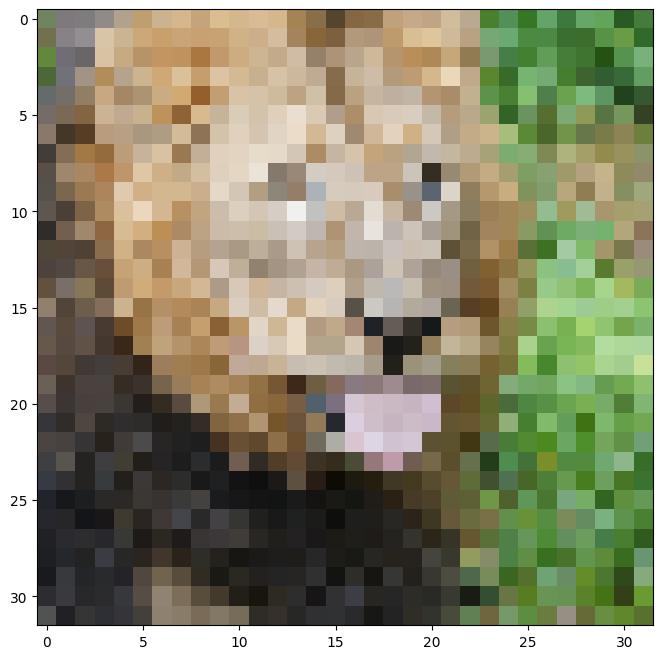

In [10]:
size = 32
train_data, test_data = get_image(size)

Some suggested hyperparameter choices to help you start
- hidden layer count: 4
- hidden layer size: 256
- number of epochs: 1000
- learning rate: 0.1


In [11]:
num_layers = 4  # you should not change this value

# TODO: Set the hyperparameters

# SGD parameters
hidden_size = 256
epochs = 3000
learning_rate = 0.1
output_size = 3

B_dict = get_B_dict(size)

print('B_dict items:')
for k,v in B_dict.items():
    print('\t',k,np.array(v).shape)

B_dict items:
	 none ()
	 basic (2, 2)
	 gauss_1.0 (16, 2)
	 gauss_10.0 (16, 2)
	 gauss_100.0 (16, 2)


In [12]:
# Apply the input feature mapping to the train and test data - already done for you
def get_input_features(B_dict, mapping):
  # mapping is the key to the B_dict, which has the value of B
  # B is then used with the function `input_mapping` to map x
  y_train = train_data[1].reshape(-1, output_size)
  y_test = test_data[1].reshape(-1, output_size)
  X_train = input_mapping(train_data[0].reshape(-1, 2), B_dict[mapping])
  X_test = input_mapping(test_data[0].reshape(-1, 2), B_dict[mapping])
  return X_train, y_train, X_test, y_test

### Plotting and video helper functions (you don't need to change anything here)

In [13]:
def plot_training_curves(train_loss, train_psnr, test_psnr):
  # plot the training loss
  plt.subplot(2, 1, 1)
  plt.plot(train_loss)
  plt.title('MSE history')
  plt.xlabel('Iteration')
  plt.ylabel('MSE Loss')

  # plot the training and testing psnr
  plt.subplot(2, 1, 2)
  plt.plot(train_psnr, label='train')
  plt.plot(test_psnr, label='test')
  plt.title('PSNR history')
  plt.xlabel('Iteration')
  plt.ylabel('PSNR')
  plt.legend()

  plt.tight_layout()
  plt.show()

def plot_reconstruction(p, y):
  p_im = p.reshape(size,size,3)
  y_im = y.reshape(size,size,3)

  plt.figure(figsize=(12,6))

  # plot the reconstruction of the image
  plt.subplot(1,2,1), plt.imshow(p_im), plt.title("reconstruction")

  # plot the ground truth image
  plt.subplot(1,2,2), plt.imshow(y_im), plt.title("ground truth")

  print("Final Test MSE", mse(y, p))
  print("Final Test psnr",psnr(y, p))

def plot_reconstruction_progress(predicted_images, y, N=8):
  total = len(predicted_images)
  step = total // N
  plt.figure(figsize=(24, 4))

  # plot the progress of reconstructions
  for i, j in enumerate(range(0,total, step)):
      plt.subplot(1, N+1, i+1)
      plt.imshow(predicted_images[j].reshape(size,size,3))
      plt.axis("off")
      plt.title(f"iter {j}")

  # plot ground truth image
  plt.subplot(1, N+1, N+1)
  plt.imshow(y.reshape(size,size,3))
  plt.title('GT')
  plt.axis("off")
  plt.show()

def plot_feature_mapping_comparison(outputs, gt):
  # plot reconstruction images for each mapping
  plt.figure(figsize=(24, 4))
  N = len(outputs)
  for i, k in enumerate(outputs):
      plt.subplot(1, N+1, i+1)
      plt.imshow(outputs[k]['pred_imgs'][-1].reshape(size, size, -1))
      plt.title(k)
  plt.subplot(1, N+1, N+1)
  plt.imshow(gt)
  plt.title('GT')
  plt.show()

  # plot train/test error curves for each mapping
  iters = len(outputs[k]['train_psnrs'])
  plt.figure(figsize=(16, 6))
  plt.subplot(121)
  for i, k in enumerate(outputs):
      plt.plot(range(iters), outputs[k]['train_psnrs'], label=k)
  plt.title('Train error')
  plt.ylabel('PSNR')
  plt.xlabel('Training iter')
  plt.legend()
  plt.subplot(122)
  for i, k in enumerate(outputs):
      plt.plot(range(iters), outputs[k]['test_psnrs'], label=k)
  plt.title('Test error')
  plt.ylabel('PSNR')
  plt.xlabel('Training iter')
  plt.legend()
  plt.show()

# Save out video
def create_and_visualize_video(outputs, size=size, epochs=epochs, filename='training_convergence.mp4'):
  all_preds = np.concatenate([outputs[n]['pred_imgs'].reshape(epochs,size,size,3)[::25] for n in outputs], axis=-2)
  data8 = (255*np.clip(all_preds, 0, 1)).astype(np.uint8)
  f = os.path.join(filename)
  imageio.mimwrite(f, data8, fps=20)

  # Display video inline
  from IPython.display import HTML
  from base64 import b64encode
  mp4 = open(f, 'rb').read()
  data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

  N = len(outputs)
  if N == 1:
    return HTML(f'''
    <video width=256 controls autoplay loop>
          <source src="{data_url}" type="video/mp4">
    </video>
    ''')
  else:
    return HTML(f'''
    <video width=1000 controls autoplay loop>
          <source src="{data_url}" type="video/mp4">
    </video>
    <table width="1000" cellspacing="0" cellpadding="0">
      <tr>{''.join(N*[f'<td width="{1000//len(outputs)}"></td>'])}</tr>
      <tr>{''.join(N*['<td style="text-align:center">{}</td>'])}</tr>
    </table>
    '''.format(*list(outputs.keys())))

### Experiment Runner (Fill in TODOs)

In [14]:
def NN_experiment(X_train, y_train, X_test, y_test, input_size, num_layers,\
                  hidden_size, output_size, epochs,\
                  learning_rate, opt='SGD'):

    # Initialize a new neural network model
    hidden_sizes = [hidden_size] * (num_layers - 1)
    net = NeuralNetwork(input_size, hidden_sizes, output_size, num_layers, opt)

    # Variables to store performance for each epoch
    train_loss = np.zeros(epochs)
    train_psnr = np.zeros(epochs)
    test_psnr = np.zeros(epochs)
    predicted_images = np.zeros((epochs, y_test.shape[0], y_test.shape[1]))

    # For each epoch...
    for epoch in tqdm(range(epochs)):
        # Shuffle the dataset
        # TODO implement this
        permutation = np.random.permutation(X_train.shape[0])
        X_train = X_train[permutation]
        y_train = y_train[permutation]
        # Training
        # Run the forward pass of the model to get a prediction and record the psnr
        # TODO implement this
        y_train_pred = net.forward(X_train)
        train_psnr[epoch] = psnr(y_train, y_train_pred)
        # Run the backward pass of the model to compute the loss, record the loss, and update the weights
        # TODO implement this
        loss = net.backward(y_train)
        train_loss[epoch] = loss
        net.update(lr=learning_rate)
        # Testing
        # No need to run the backward pass here, just run the forward pass to compute and record the psnr
        # TODO implement this
        y_test_pred = net.forward(X_test)
        test_psnr[epoch] = psnr(y_test, y_test_pred)
        predicted_images[epoch] = y_test_pred
        # Print results every 10 epochs
        if epoch % 100 == 0:
            print(f"Epoch {epoch}: Loss = {loss:.4f}, Train PSNR = {train_psnr[epoch]:.2f}, Test PSNR = {test_psnr[epoch]:.2f}")
    return net, train_psnr, test_psnr, train_loss, predicted_images

# Low Resolution Reconstruction

#### Low Resolution Reconstruction - SGD - None Mapping

*SGD*

(256, 2)
(256, 3)
(1024, 2)
(1024, 3)


  0%|          | 0/3000 [00:00<?, ?it/s]

Epoch 0: Loss = 0.0492, Train PSNR = 10.07, Test PSNR = 10.13
Epoch 100: Loss = 0.0331, Train PSNR = 11.79, Test PSNR = 11.86
Epoch 200: Loss = 0.0310, Train PSNR = 12.08, Test PSNR = 12.20
Epoch 300: Loss = 0.0298, Train PSNR = 12.25, Test PSNR = 12.39
Epoch 400: Loss = 0.0287, Train PSNR = 12.41, Test PSNR = 12.56
Epoch 500: Loss = 0.0278, Train PSNR = 12.55, Test PSNR = 12.71
Epoch 600: Loss = 0.0269, Train PSNR = 12.69, Test PSNR = 12.85
Epoch 700: Loss = 0.0262, Train PSNR = 12.81, Test PSNR = 12.98
Epoch 800: Loss = 0.0255, Train PSNR = 12.93, Test PSNR = 13.10
Epoch 900: Loss = 0.0248, Train PSNR = 13.04, Test PSNR = 13.22
Epoch 1000: Loss = 0.0243, Train PSNR = 13.14, Test PSNR = 13.31
Epoch 1100: Loss = 0.0238, Train PSNR = 13.22, Test PSNR = 13.40
Epoch 1200: Loss = 0.0234, Train PSNR = 13.30, Test PSNR = 13.48
Epoch 1300: Loss = 0.0230, Train PSNR = 13.37, Test PSNR = 13.55
Epoch 1400: Loss = 0.0227, Train PSNR = 13.44, Test PSNR = 13.61
Epoch 1500: Loss = 0.0224, Train PSNR

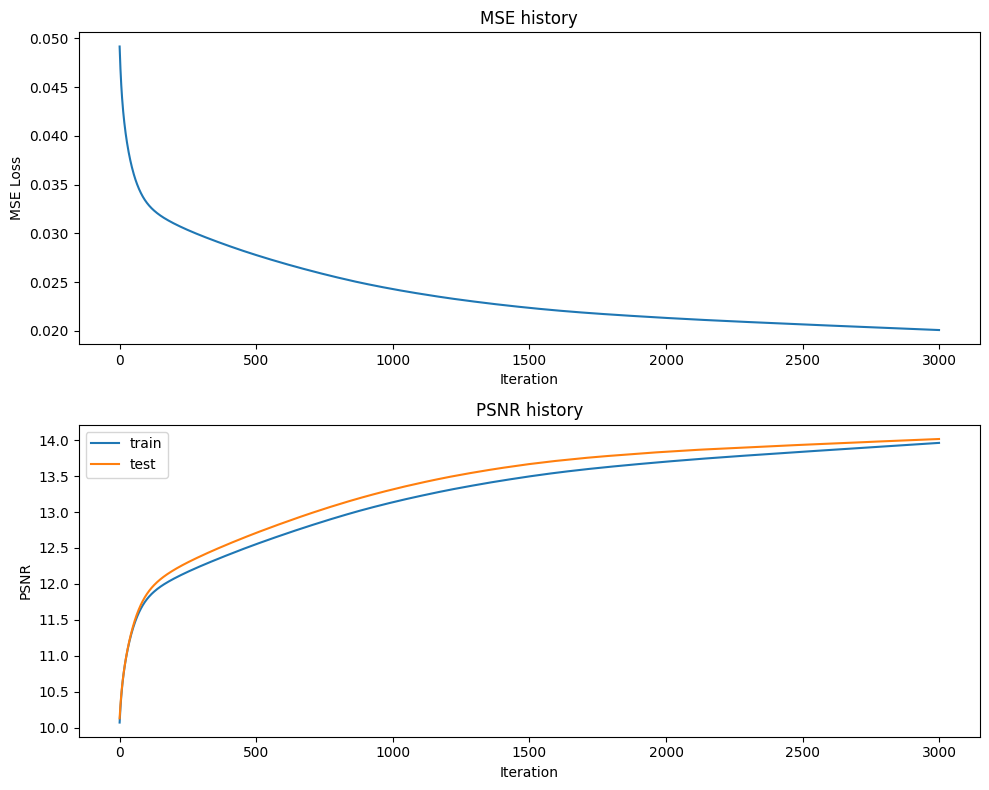

Final Test MSE 0.019839593218569998
Final Test psnr 14.01437240990716


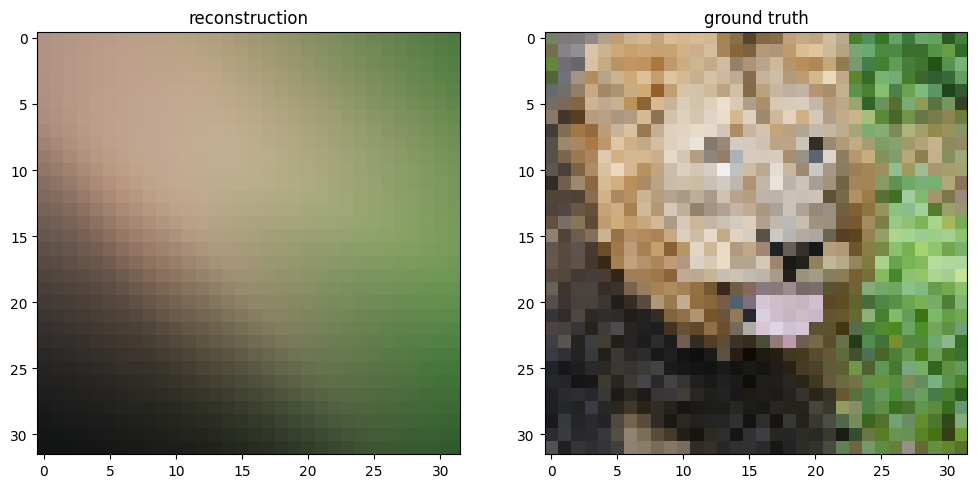

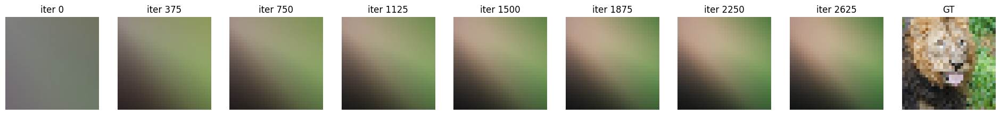

In [ ]:
# get input features
# TODO implement this by using the get_B_dict() and get_input_features() helper functions
X_train, y_train, X_test, y_test = get_input_features(get_B_dict(size), "none")

# run NN experiment on input features
# TODO implement by using the NN_experiment() helper function
net, train_psnr, test_psnr, train_loss, predicted_images = NN_experiment(X_train, y_train, X_test, y_test, X_train.shape[1], num_layers, hidden_size, output_size, epochs, learning_rate, opt='SGD')

# plot results of experiment
plot_training_curves(train_loss, train_psnr, test_psnr)
plot_reconstruction(net.forward(X_test), y_test)
plot_reconstruction_progress(predicted_images, y_test)

*ADAM*

In [ ]:
# ADAM parameters
hidden_size = 64
epochs = 2000
learning_rate = 9e-4
output_size = 3

(256, 2)
(256, 3)
(1024, 2)
(1024, 3)


  0%|          | 0/2000 [00:00<?, ?it/s]

Epoch 0: Loss = 0.0596, Train PSNR = 9.24, Test PSNR = 9.78
Epoch 100: Loss = 0.0167, Train PSNR = 14.77, Test PSNR = 14.51
Epoch 200: Loss = 0.0147, Train PSNR = 15.32, Test PSNR = 14.83
Epoch 300: Loss = 0.0134, Train PSNR = 15.72, Test PSNR = 14.99
Epoch 400: Loss = 0.0121, Train PSNR = 16.18, Test PSNR = 15.37
Epoch 500: Loss = 0.0109, Train PSNR = 16.61, Test PSNR = 15.66
Epoch 600: Loss = 0.0102, Train PSNR = 16.91, Test PSNR = 15.92
Epoch 700: Loss = 0.0096, Train PSNR = 17.15, Test PSNR = 16.00
Epoch 800: Loss = 0.0092, Train PSNR = 17.33, Test PSNR = 16.05
Epoch 900: Loss = 0.0090, Train PSNR = 17.44, Test PSNR = 16.02
Epoch 1000: Loss = 0.0088, Train PSNR = 17.53, Test PSNR = 16.13
Epoch 1100: Loss = 0.0087, Train PSNR = 17.61, Test PSNR = 16.10
Epoch 1200: Loss = 0.0085, Train PSNR = 17.68, Test PSNR = 16.13
Epoch 1300: Loss = 0.0084, Train PSNR = 17.74, Test PSNR = 16.15
Epoch 1400: Loss = 0.0083, Train PSNR = 17.81, Test PSNR = 16.17
Epoch 1500: Loss = 0.0082, Train PSNR =

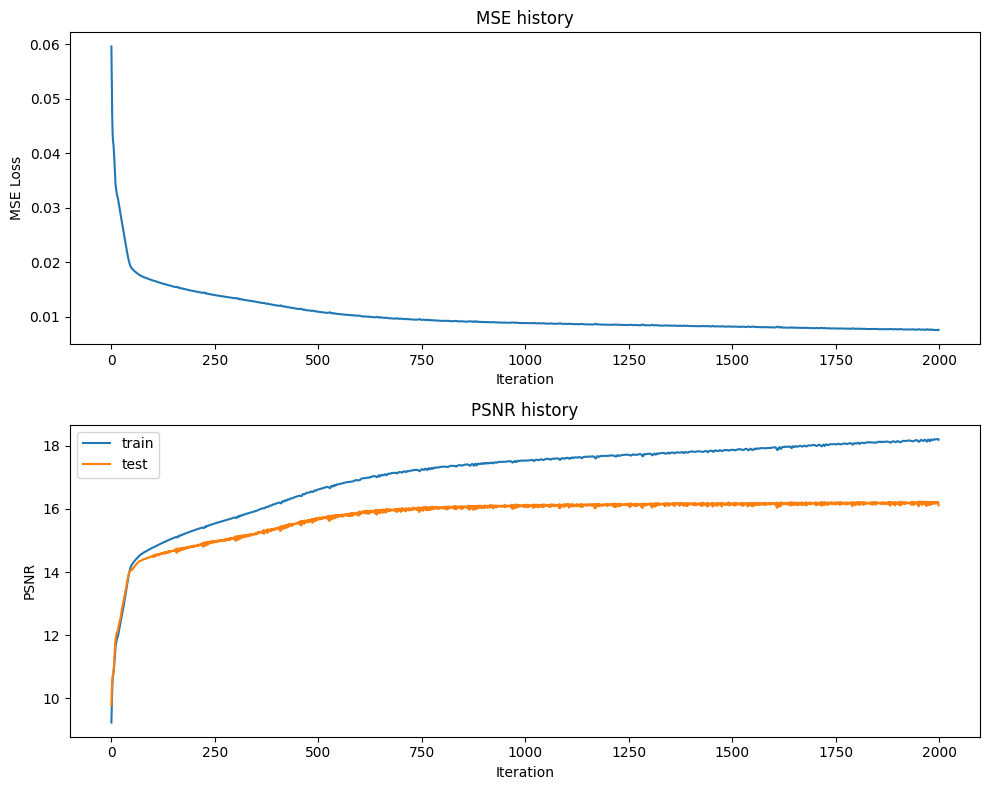

Final Test MSE 0.012250943683540029
Final Test psnr 16.108004608788185


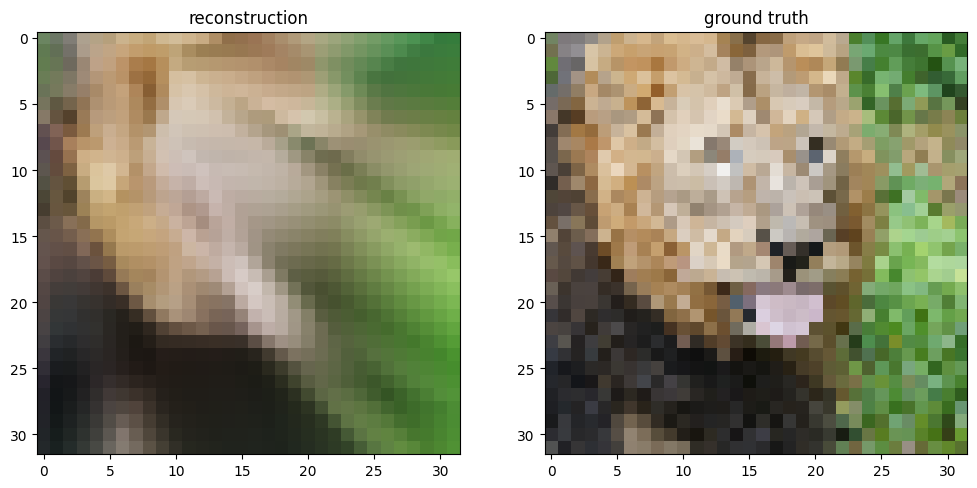

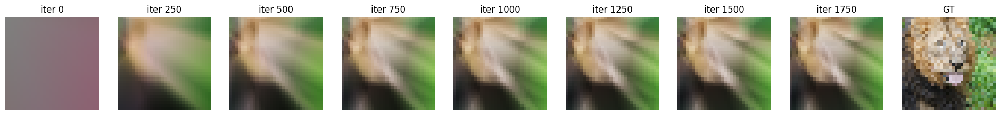

In [ ]:
# get input features
X_train, y_train, X_test, y_test = get_input_features(get_B_dict(size), "none")

# run NN experiment on input features
# TODO implement by using the NN_experiment() helper function
net, train_psnr, test_psnr, train_loss, predicted_images = NN_experiment(X_train, y_train, X_test, y_test, X_train.shape[1], num_layers, hidden_size, output_size, epochs, learning_rate, opt='Adam')

# plot results of experiment
plot_training_curves(train_loss, train_psnr, test_psnr)
plot_reconstruction(net.forward(X_test), y_test)
plot_reconstruction_progress(predicted_images, y_test)

#### Low Resolution Reconstruction - SGD - Various Input Mapping Stategies

In [15]:
def train_wrapper(mapping, size, num_layers, hidden_size, output_size, epochs,  learning_rate, opt='SGD'):
    # TODO implement me
    # makes it easy to run all your mapping experiments in a for loop
    # this will similar to what you did previously in the last two sections
    # get input features
    B_dict = get_B_dict(size)
    print(f'Training: {mapping}')
    X_train, y_train, X_test, y_test = get_input_features(B_dict, mapping)
    print(X_train.shape)
    print(y_train.shape)
    print(X_test.shape)
    print(y_test.shape)
    # run NN experiment on input features
    input_size = X_train.shape[1]
    print("Input Size: " + str(input_size))
    net, train_psnrs, test_psnrs, train_loss, predicted_images = NN_experiment(X_train, y_train, X_test, y_test, input_size, num_layers, hidden_size, output_size, epochs, learning_rate, opt)
    # Plot
    plot_training_curves(train_loss, train_psnrs, test_psnrs)
    plot_reconstruction(net.forward(X_test), y_test)
    plot_reconstruction_progress(predicted_images, y_test)
    return {
        'net': net,
        'train_psnrs': train_psnrs,
        'test_psnrs': test_psnrs,
        'train_loss': train_loss,
        'pred_imgs': predicted_images
    }

  0%|          | 0/5 [00:00<?, ?it/s]

training none
Training: none
(256, 2)
(256, 3)
(1024, 2)
(1024, 3)
Input Size: 2


  0%|          | 0/3000 [00:00<?, ?it/s]

Epoch 0: Loss = 0.0583, Train PSNR = 9.33, Test PSNR = 9.59
Epoch 100: Loss = 0.0340, Train PSNR = 11.67, Test PSNR = 11.74
Epoch 200: Loss = 0.0315, Train PSNR = 12.01, Test PSNR = 12.12
Epoch 300: Loss = 0.0300, Train PSNR = 12.22, Test PSNR = 12.36
Epoch 400: Loss = 0.0288, Train PSNR = 12.40, Test PSNR = 12.55
Epoch 500: Loss = 0.0277, Train PSNR = 12.57, Test PSNR = 12.72
Epoch 600: Loss = 0.0267, Train PSNR = 12.72, Test PSNR = 12.88
Epoch 700: Loss = 0.0259, Train PSNR = 12.86, Test PSNR = 13.03
Epoch 800: Loss = 0.0251, Train PSNR = 12.99, Test PSNR = 13.16
Epoch 900: Loss = 0.0245, Train PSNR = 13.10, Test PSNR = 13.28
Epoch 1000: Loss = 0.0239, Train PSNR = 13.20, Test PSNR = 13.38
Epoch 1100: Loss = 0.0234, Train PSNR = 13.30, Test PSNR = 13.47
Epoch 1200: Loss = 0.0230, Train PSNR = 13.37, Test PSNR = 13.55
Epoch 1300: Loss = 0.0226, Train PSNR = 13.44, Test PSNR = 13.62
Epoch 1400: Loss = 0.0223, Train PSNR = 13.50, Test PSNR = 13.67
Epoch 1500: Loss = 0.0220, Train PSNR =

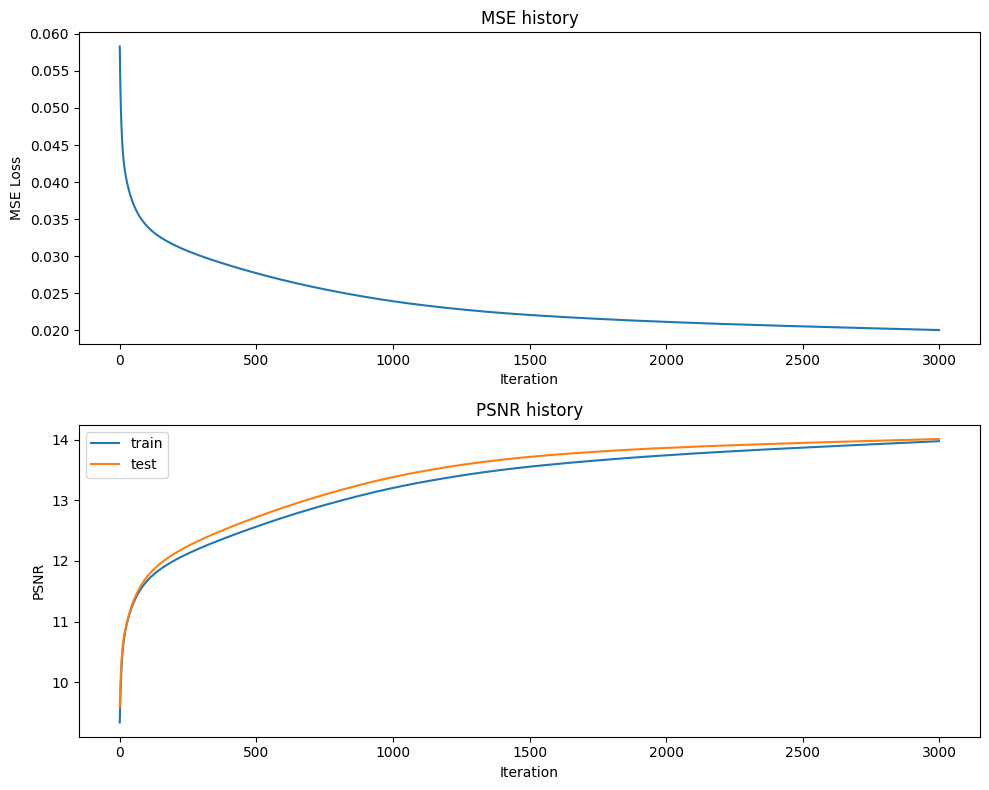

Final Test MSE 0.01984579873807719
Final Test psnr 14.013014215988235


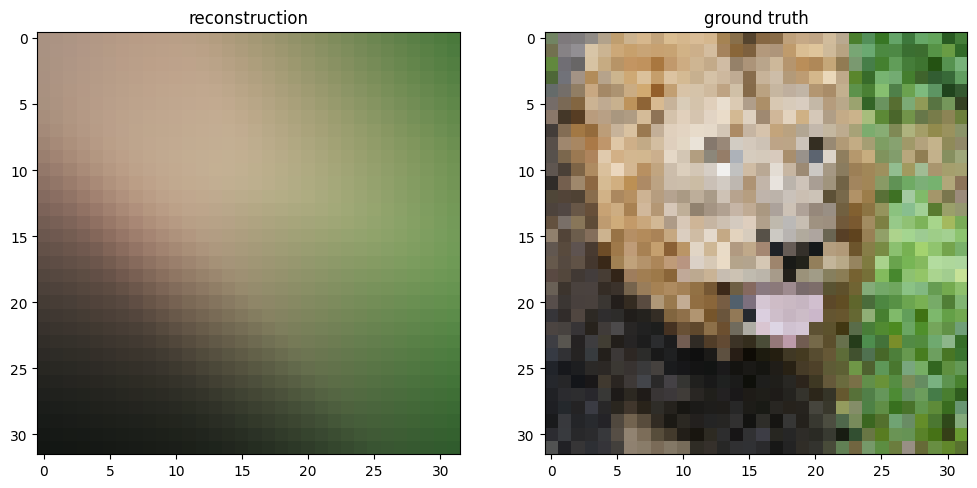

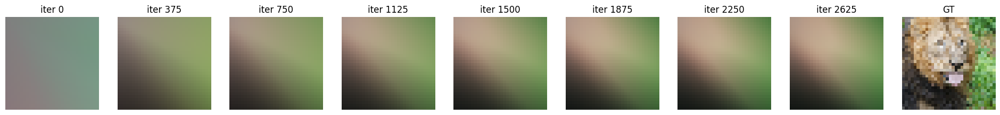

training basic
Training: basic
(256, 4)
(256, 3)
(1024, 4)
(1024, 3)
Input Size: 4


  0%|          | 0/3000 [00:00<?, ?it/s]

Epoch 0: Loss = 0.0543, Train PSNR = 9.64, Test PSNR = 9.79
Epoch 100: Loss = 0.0223, Train PSNR = 13.50, Test PSNR = 13.41
Epoch 200: Loss = 0.0190, Train PSNR = 14.19, Test PSNR = 14.10
Epoch 300: Loss = 0.0175, Train PSNR = 14.57, Test PSNR = 14.46
Epoch 400: Loss = 0.0164, Train PSNR = 14.83, Test PSNR = 14.70
Epoch 500: Loss = 0.0157, Train PSNR = 15.04, Test PSNR = 14.88
Epoch 600: Loss = 0.0151, Train PSNR = 15.21, Test PSNR = 15.01
Epoch 700: Loss = 0.0145, Train PSNR = 15.36, Test PSNR = 15.12
Epoch 800: Loss = 0.0141, Train PSNR = 15.49, Test PSNR = 15.21
Epoch 900: Loss = 0.0137, Train PSNR = 15.61, Test PSNR = 15.29
Epoch 1000: Loss = 0.0134, Train PSNR = 15.72, Test PSNR = 15.36
Epoch 1100: Loss = 0.0131, Train PSNR = 15.82, Test PSNR = 15.42
Epoch 1200: Loss = 0.0128, Train PSNR = 15.91, Test PSNR = 15.47
Epoch 1300: Loss = 0.0126, Train PSNR = 16.00, Test PSNR = 15.52
Epoch 1400: Loss = 0.0123, Train PSNR = 16.09, Test PSNR = 15.57
Epoch 1500: Loss = 0.0121, Train PSNR =

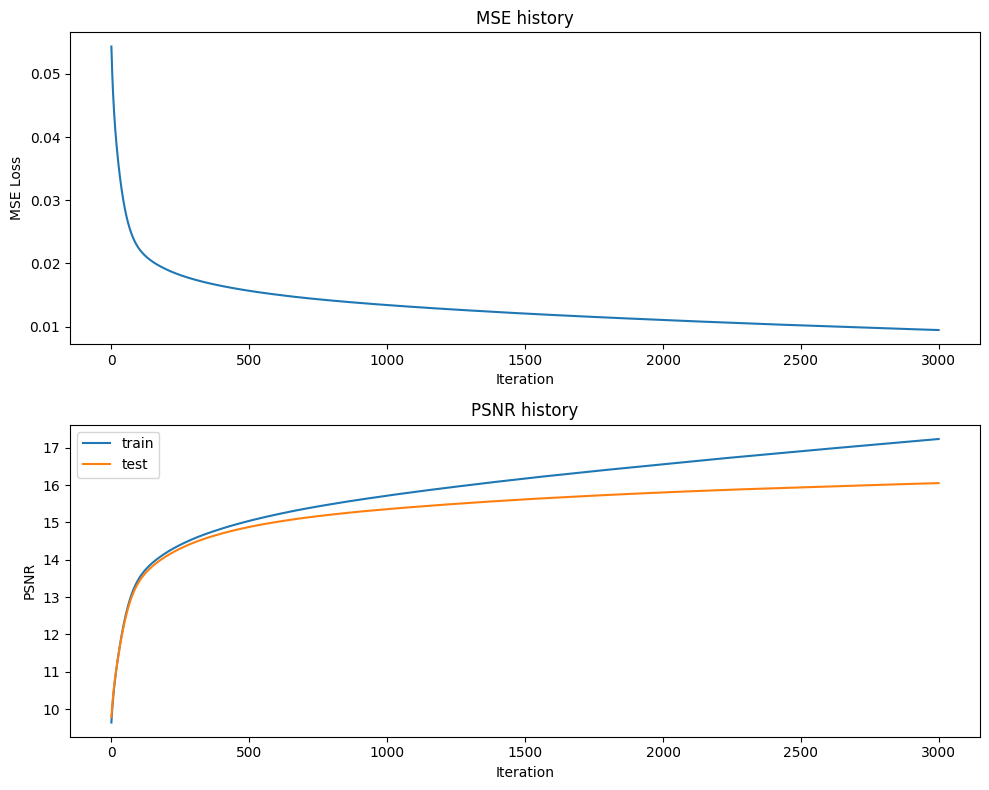

Final Test MSE 0.012409073153926331
Final Test psnr 16.052306595147634


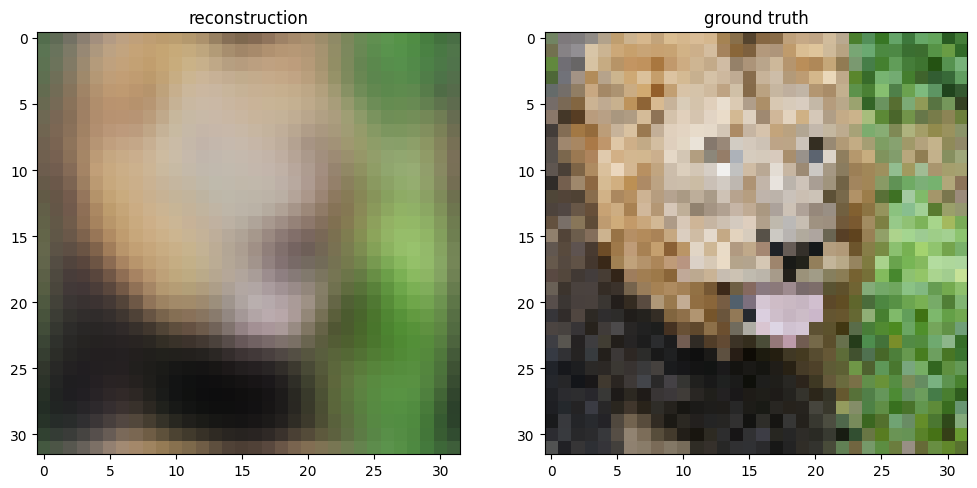

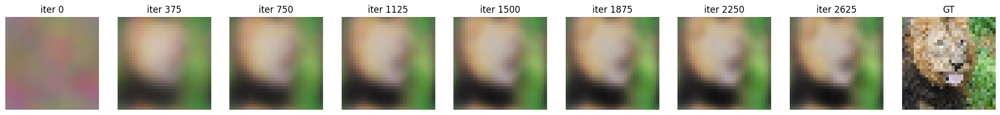

training gauss_1.0
Training: gauss_1.0
(256, 32)
(256, 3)
(1024, 32)
(1024, 3)
Input Size: 32


  0%|          | 0/3000 [00:00<?, ?it/s]

Epoch 0: Loss = 0.0580, Train PSNR = 9.35, Test PSNR = 9.48
Epoch 100: Loss = 0.0233, Train PSNR = 13.32, Test PSNR = 13.42
Epoch 200: Loss = 0.0168, Train PSNR = 14.75, Test PSNR = 14.80
Epoch 300: Loss = 0.0144, Train PSNR = 15.39, Test PSNR = 15.31
Epoch 400: Loss = 0.0131, Train PSNR = 15.82, Test PSNR = 15.58
Epoch 500: Loss = 0.0122, Train PSNR = 16.13, Test PSNR = 15.76
Epoch 600: Loss = 0.0115, Train PSNR = 16.40, Test PSNR = 15.90
Epoch 700: Loss = 0.0108, Train PSNR = 16.64, Test PSNR = 16.01
Epoch 800: Loss = 0.0103, Train PSNR = 16.86, Test PSNR = 16.11
Epoch 900: Loss = 0.0098, Train PSNR = 17.07, Test PSNR = 16.20
Epoch 1000: Loss = 0.0094, Train PSNR = 17.27, Test PSNR = 16.28
Epoch 1100: Loss = 0.0090, Train PSNR = 17.46, Test PSNR = 16.35
Epoch 1200: Loss = 0.0086, Train PSNR = 17.65, Test PSNR = 16.41
Epoch 1300: Loss = 0.0082, Train PSNR = 17.83, Test PSNR = 16.47
Epoch 1400: Loss = 0.0079, Train PSNR = 18.01, Test PSNR = 16.53
Epoch 1500: Loss = 0.0076, Train PSNR =

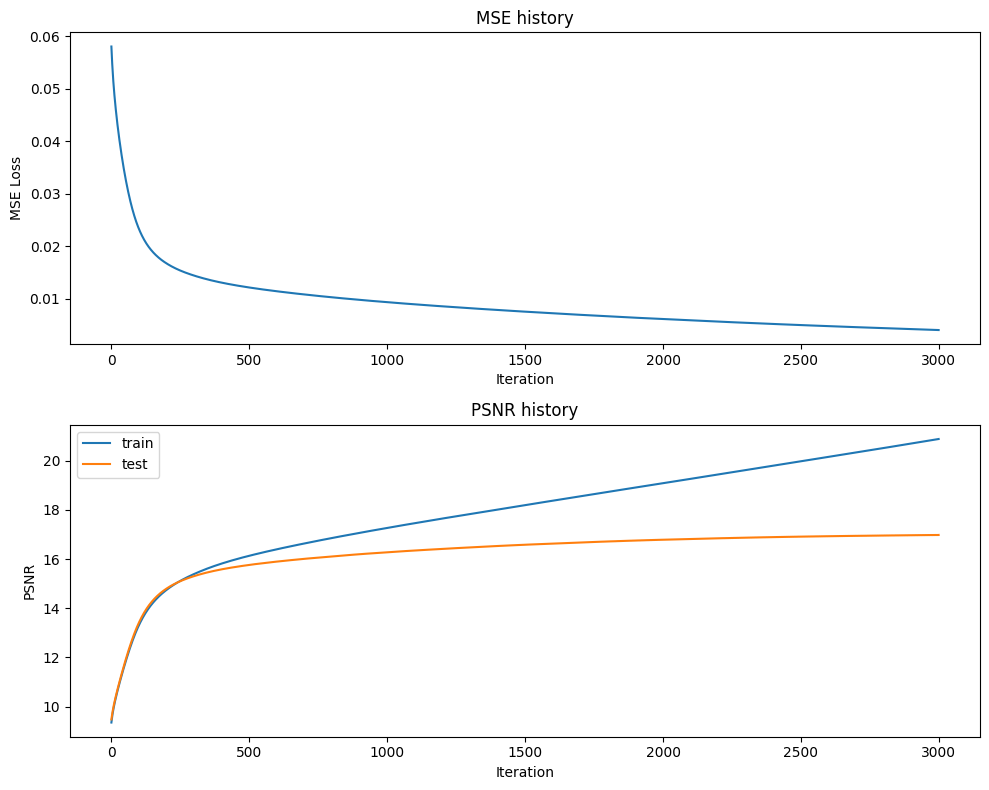

Final Test MSE 0.010022087700191485
Final Test psnr 16.98011805536169


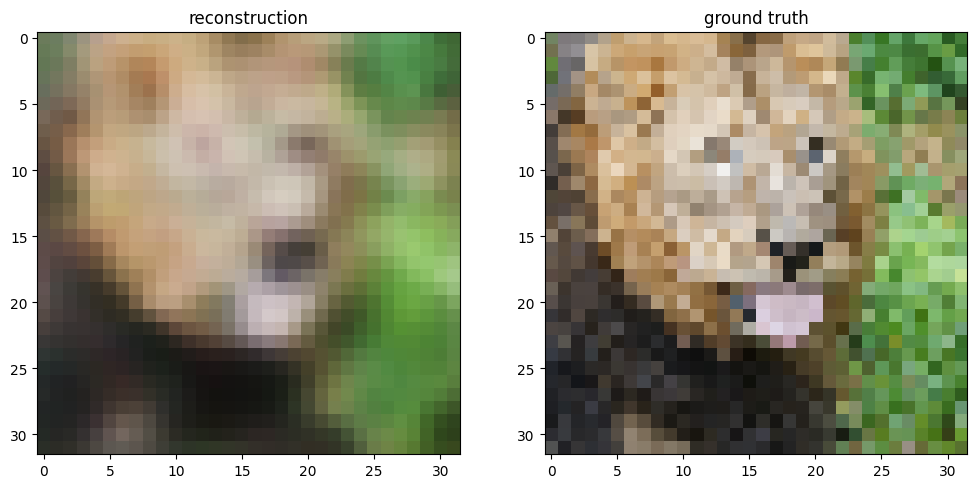

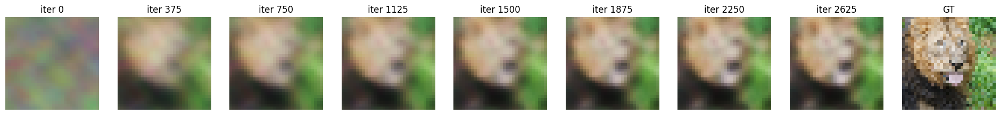

training gauss_10.0
Training: gauss_10.0
(256, 32)
(256, 3)
(1024, 32)
(1024, 3)
Input Size: 32


  0%|          | 0/3000 [00:00<?, ?it/s]

Epoch 0: Loss = 0.0552, Train PSNR = 9.57, Test PSNR = 9.71
Epoch 100: Loss = 0.0465, Train PSNR = 10.32, Test PSNR = 10.06
Epoch 200: Loss = 0.0431, Train PSNR = 10.65, Test PSNR = 10.12
Epoch 300: Loss = 0.0396, Train PSNR = 11.02, Test PSNR = 10.16
Epoch 400: Loss = 0.0358, Train PSNR = 11.46, Test PSNR = 10.19
Epoch 500: Loss = 0.0315, Train PSNR = 12.01, Test PSNR = 10.22
Epoch 600: Loss = 0.0268, Train PSNR = 12.70, Test PSNR = 10.25
Epoch 700: Loss = 0.0220, Train PSNR = 13.56, Test PSNR = 10.28
Epoch 800: Loss = 0.0174, Train PSNR = 14.58, Test PSNR = 10.28
Epoch 900: Loss = 0.0133, Train PSNR = 15.74, Test PSNR = 10.26
Epoch 1000: Loss = 0.0100, Train PSNR = 16.98, Test PSNR = 10.22
Epoch 1100: Loss = 0.0076, Train PSNR = 18.21, Test PSNR = 10.16
Epoch 1200: Loss = 0.0058, Train PSNR = 19.37, Test PSNR = 10.11
Epoch 1300: Loss = 0.0045, Train PSNR = 20.42, Test PSNR = 10.05
Epoch 1400: Loss = 0.0037, Train PSNR = 21.35, Test PSNR = 10.00
Epoch 1500: Loss = 0.0030, Train PSNR =

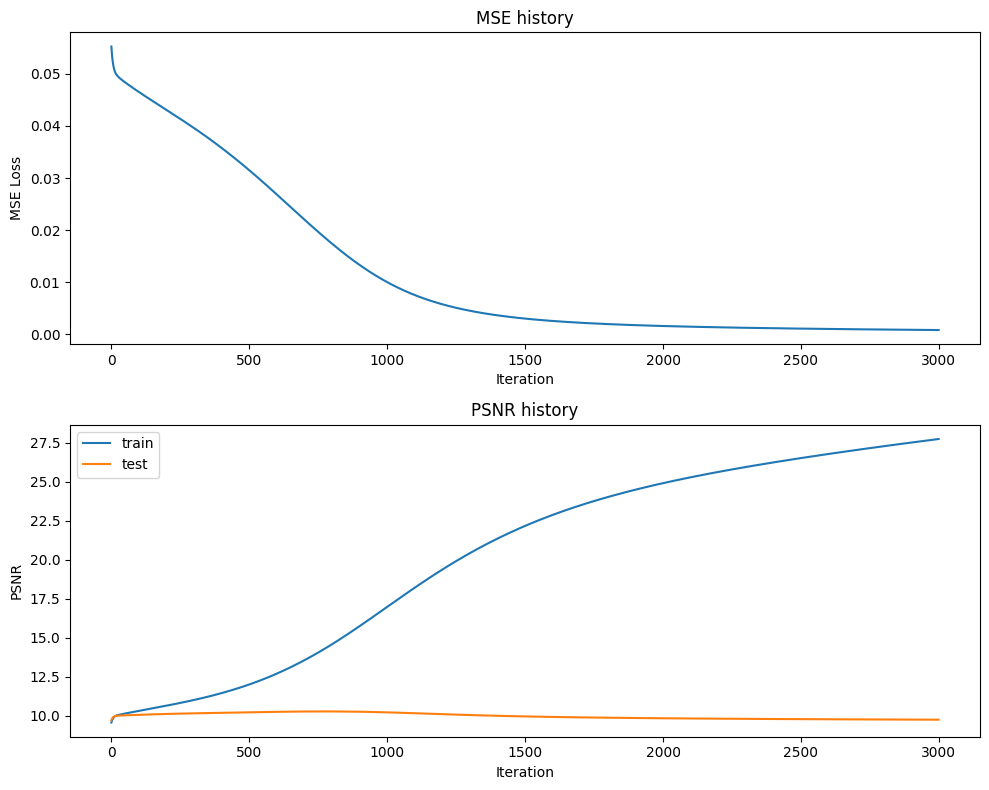

Final Test MSE 0.05295424453979267
Final Test psnr 9.750692276860889


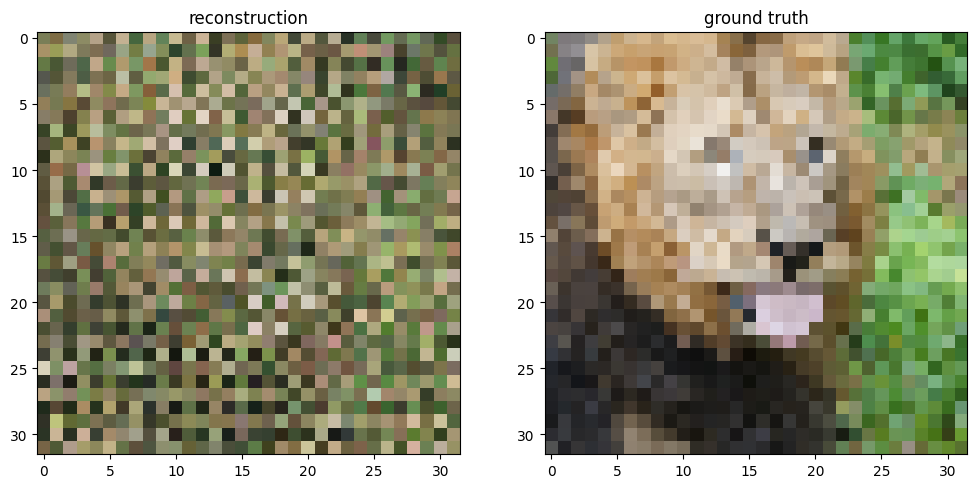

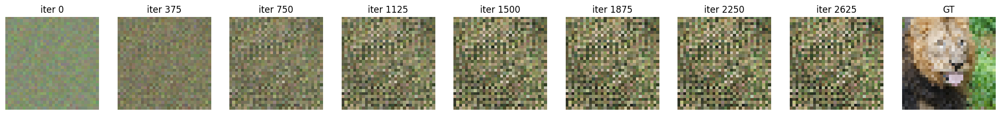

training gauss_100.0
Training: gauss_100.0
(256, 32)
(256, 3)
(1024, 32)
(1024, 3)
Input Size: 32


  0%|          | 0/3000 [00:00<?, ?it/s]

Epoch 0: Loss = 0.0540, Train PSNR = 9.67, Test PSNR = 9.74
Epoch 100: Loss = 0.0449, Train PSNR = 10.46, Test PSNR = 10.10
Epoch 200: Loss = 0.0406, Train PSNR = 10.90, Test PSNR = 10.19
Epoch 300: Loss = 0.0365, Train PSNR = 11.37, Test PSNR = 10.26
Epoch 400: Loss = 0.0323, Train PSNR = 11.90, Test PSNR = 10.32
Epoch 500: Loss = 0.0279, Train PSNR = 12.53, Test PSNR = 10.37
Epoch 600: Loss = 0.0235, Train PSNR = 13.28, Test PSNR = 10.43
Epoch 700: Loss = 0.0191, Train PSNR = 14.17, Test PSNR = 10.47
Epoch 800: Loss = 0.0151, Train PSNR = 15.19, Test PSNR = 10.50
Epoch 900: Loss = 0.0117, Train PSNR = 16.30, Test PSNR = 10.51
Epoch 1000: Loss = 0.0090, Train PSNR = 17.44, Test PSNR = 10.49
Epoch 1100: Loss = 0.0070, Train PSNR = 18.56, Test PSNR = 10.46
Epoch 1200: Loss = 0.0055, Train PSNR = 19.60, Test PSNR = 10.42
Epoch 1300: Loss = 0.0044, Train PSNR = 20.54, Test PSNR = 10.37
Epoch 1400: Loss = 0.0037, Train PSNR = 21.36, Test PSNR = 10.34
Epoch 1500: Loss = 0.0031, Train PSNR =

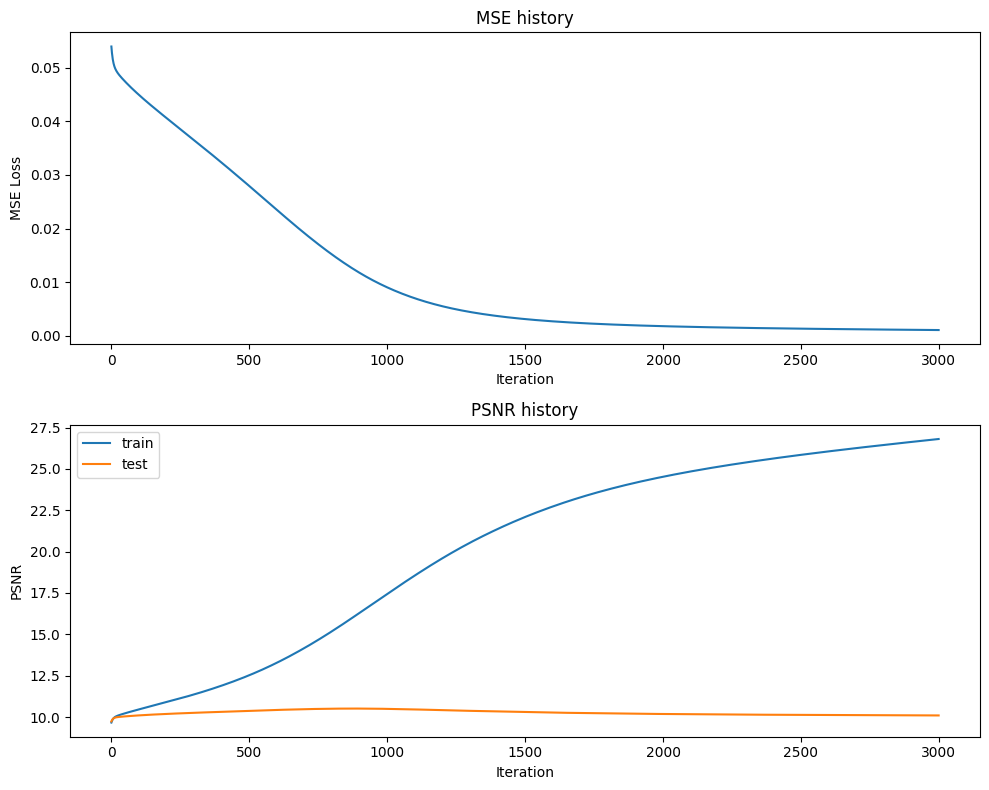

Final Test MSE 0.048897713489199246
Final Test psnr 10.096814528246798


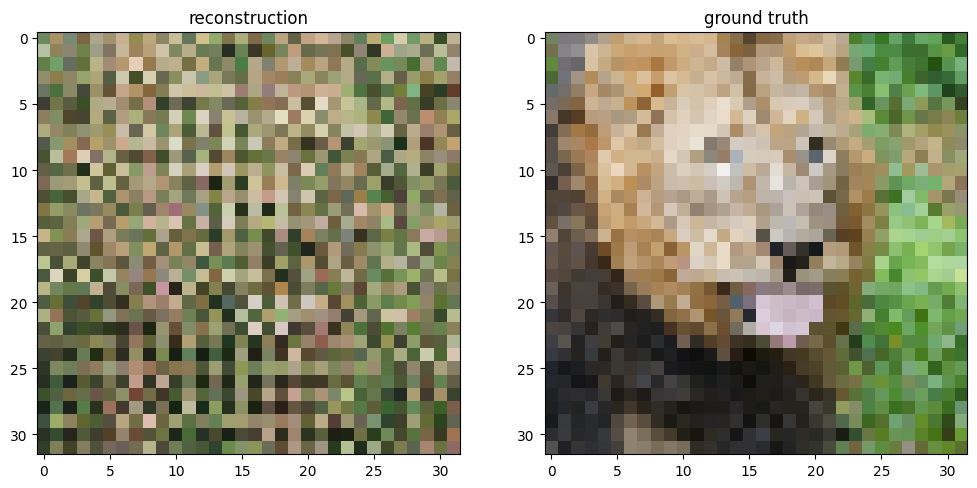

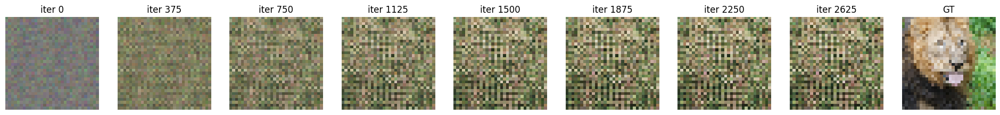

In [ ]:
# SGD
hidden_size = 256
epochs = 3000
learning_rate = 0.1
output_size = 3

outputs = {}
for k in tqdm(B_dict):
  print("training", k)
  outputs[k] = train_wrapper(k, size, num_layers, hidden_size, output_size, epochs, learning_rate, opt='SGD')

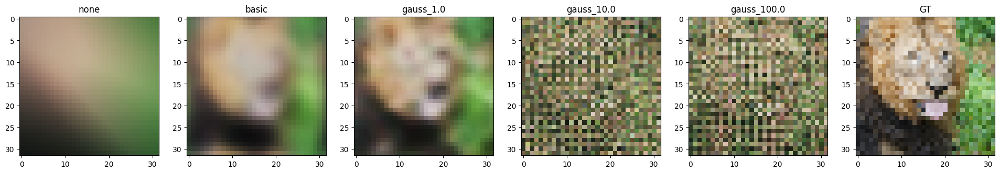

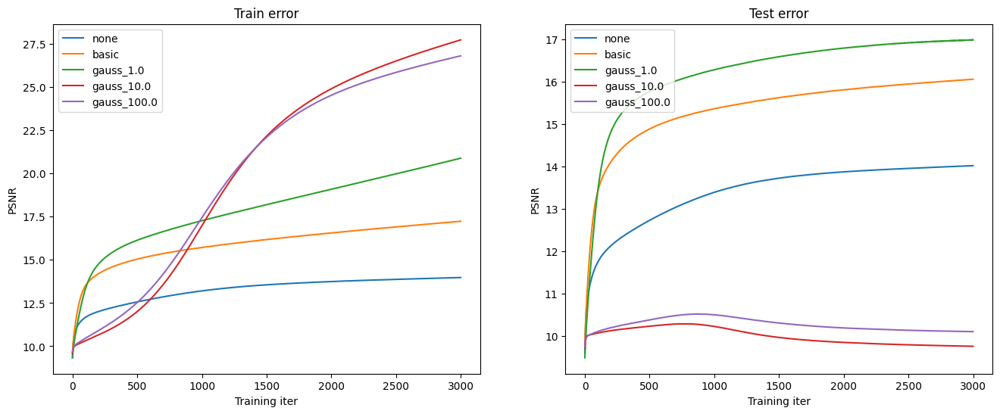

In [ ]:
# if you did everything correctly so far, this should output a nice figure you can use in your report
plot_feature_mapping_comparison(outputs, y_test.reshape(size,size,3))

#### Low Resolution Reconstruction - Adam - Various Input Mapping Stategies

  0%|          | 0/5 [00:00<?, ?it/s]

training none
Training: none
(256, 2)
(256, 3)
(1024, 2)
(1024, 3)
Input Size: 2


  0%|          | 0/2000 [00:00<?, ?it/s]

Epoch 0: Loss = 0.0551, Train PSNR = 9.58, Test PSNR = 10.02
Epoch 100: Loss = 0.0170, Train PSNR = 14.68, Test PSNR = 14.45
Epoch 200: Loss = 0.0152, Train PSNR = 15.16, Test PSNR = 14.77
Epoch 300: Loss = 0.0133, Train PSNR = 15.75, Test PSNR = 15.10
Epoch 400: Loss = 0.0121, Train PSNR = 16.16, Test PSNR = 15.45
Epoch 500: Loss = 0.0114, Train PSNR = 16.43, Test PSNR = 15.60
Epoch 600: Loss = 0.0109, Train PSNR = 16.62, Test PSNR = 15.73
Epoch 700: Loss = 0.0106, Train PSNR = 16.76, Test PSNR = 15.76
Epoch 800: Loss = 0.0103, Train PSNR = 16.87, Test PSNR = 15.82
Epoch 900: Loss = 0.0101, Train PSNR = 16.95, Test PSNR = 15.81
Epoch 1000: Loss = 0.0098, Train PSNR = 17.06, Test PSNR = 15.88
Epoch 1100: Loss = 0.0096, Train PSNR = 17.15, Test PSNR = 15.90
Epoch 1200: Loss = 0.0095, Train PSNR = 17.22, Test PSNR = 15.92
Epoch 1300: Loss = 0.0093, Train PSNR = 17.30, Test PSNR = 15.96
Epoch 1400: Loss = 0.0092, Train PSNR = 17.37, Test PSNR = 16.03
Epoch 1500: Loss = 0.0090, Train PSNR 

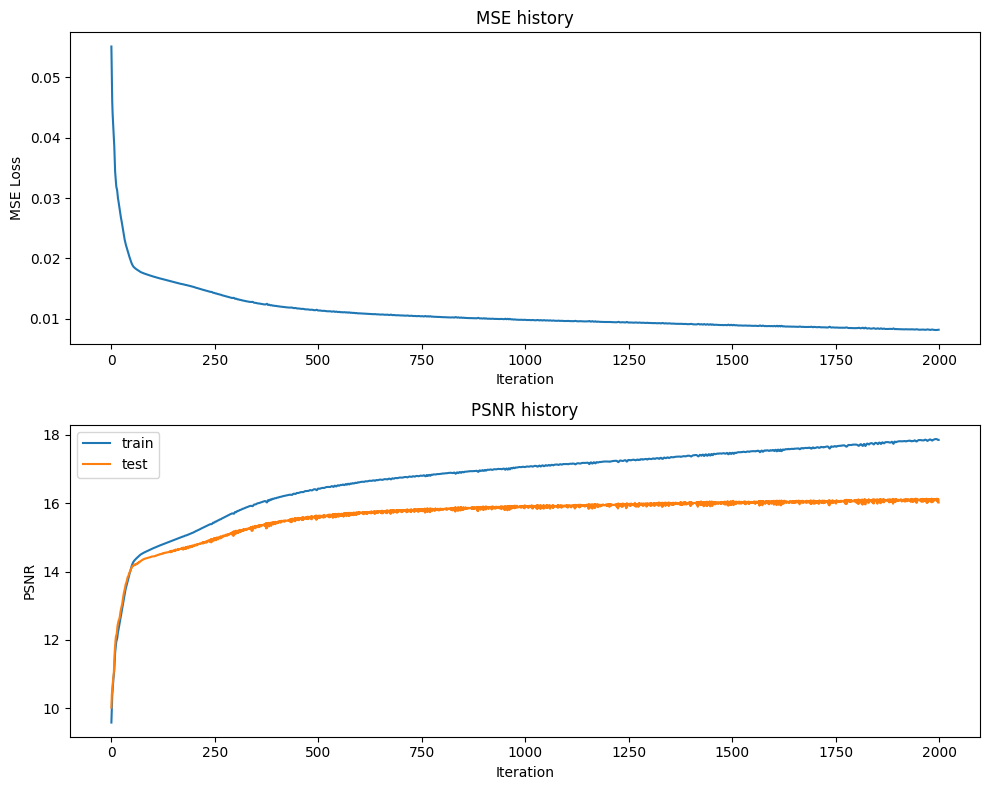

Final Test MSE 0.012488367255365505
Final Test psnr 16.02464342450024


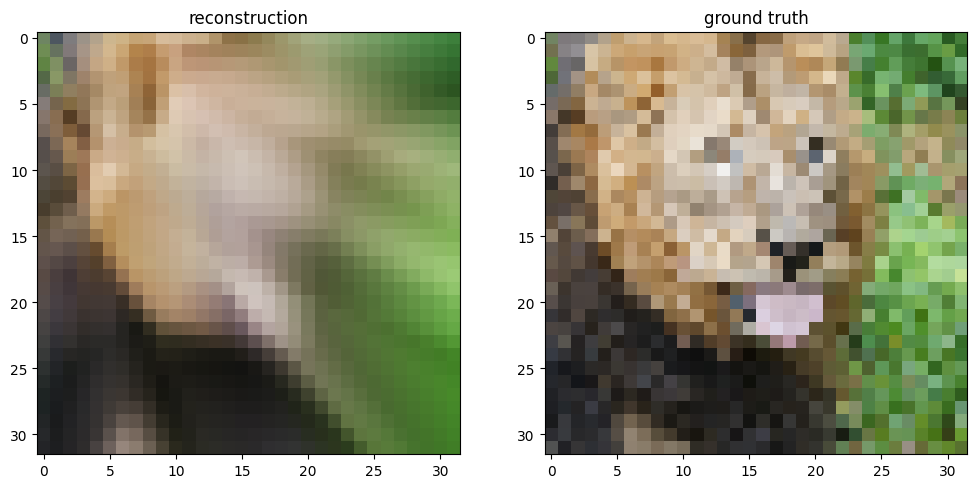

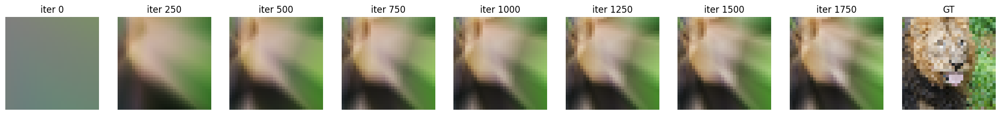

training basic
Training: basic
(256, 4)
(256, 3)
(1024, 4)
(1024, 3)
Input Size: 4


  0%|          | 0/2000 [00:00<?, ?it/s]

Epoch 0: Loss = 0.0603, Train PSNR = 9.18, Test PSNR = 10.03
Epoch 100: Loss = 0.0070, Train PSNR = 18.55, Test PSNR = 16.36
Epoch 200: Loss = 0.0029, Train PSNR = 22.38, Test PSNR = 16.49
Epoch 300: Loss = 0.0014, Train PSNR = 25.61, Test PSNR = 16.43
Epoch 400: Loss = 0.0008, Train PSNR = 27.99, Test PSNR = 16.28
Epoch 500: Loss = 0.0005, Train PSNR = 29.61, Test PSNR = 16.21
Epoch 600: Loss = 0.0004, Train PSNR = 30.91, Test PSNR = 16.22
Epoch 700: Loss = 0.0003, Train PSNR = 31.74, Test PSNR = 16.17
Epoch 800: Loss = 0.0003, Train PSNR = 32.17, Test PSNR = 16.18
Epoch 900: Loss = 0.0002, Train PSNR = 33.08, Test PSNR = 16.16
Epoch 1000: Loss = 0.0002, Train PSNR = 33.64, Test PSNR = 16.12
Epoch 1100: Loss = 0.0002, Train PSNR = 34.16, Test PSNR = 16.12
Epoch 1200: Loss = 0.0002, Train PSNR = 34.66, Test PSNR = 16.12
Epoch 1300: Loss = 0.0002, Train PSNR = 34.78, Test PSNR = 16.14
Epoch 1400: Loss = 0.0002, Train PSNR = 35.04, Test PSNR = 16.14
Epoch 1500: Loss = 0.0001, Train PSNR 

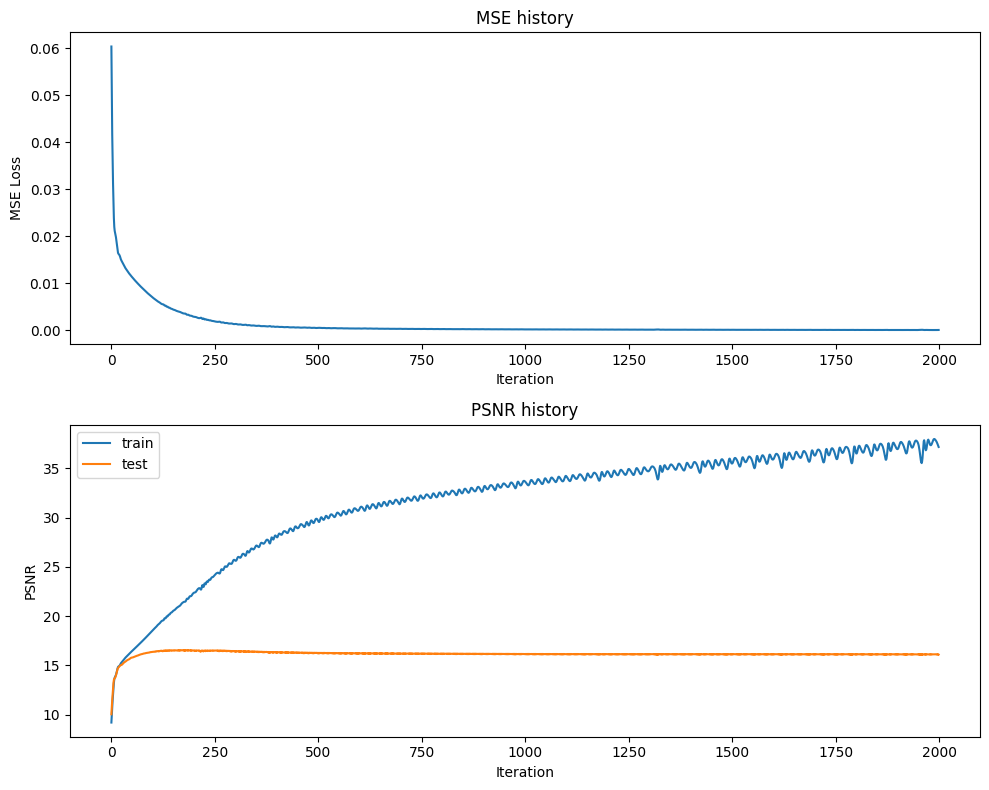

Final Test MSE 0.01231528107972159
Final Test psnr 16.08525675860532


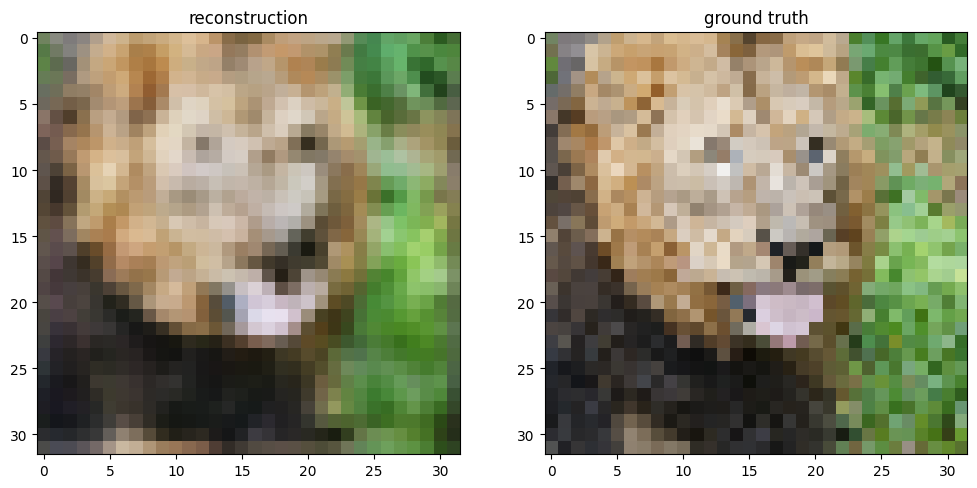

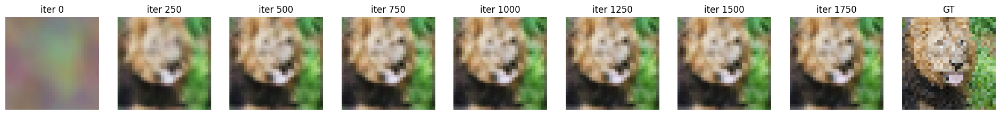

training gauss_1.0
Training: gauss_1.0
(256, 32)
(256, 3)
(1024, 32)
(1024, 3)
Input Size: 32


  0%|          | 0/2000 [00:00<?, ?it/s]

Epoch 0: Loss = 0.0512, Train PSNR = 9.90, Test PSNR = 10.45
Epoch 100: Loss = 0.0007, Train PSNR = 28.75, Test PSNR = 16.58
Epoch 200: Loss = 0.0001, Train PSNR = 35.99, Test PSNR = 16.46
Epoch 300: Loss = 0.0001, Train PSNR = 39.43, Test PSNR = 16.41
Epoch 400: Loss = 0.0000, Train PSNR = 41.92, Test PSNR = 16.39
Epoch 500: Loss = 0.0000, Train PSNR = 44.16, Test PSNR = 16.35
Epoch 600: Loss = 0.0000, Train PSNR = 46.08, Test PSNR = 16.36
Epoch 700: Loss = 0.0000, Train PSNR = 48.56, Test PSNR = 16.34
Epoch 800: Loss = 0.0000, Train PSNR = 49.84, Test PSNR = 16.33
Epoch 900: Loss = 0.0000, Train PSNR = 50.54, Test PSNR = 16.33
Epoch 1000: Loss = 0.0000, Train PSNR = 54.50, Test PSNR = 16.34
Epoch 1100: Loss = 0.0000, Train PSNR = 56.02, Test PSNR = 16.34
Epoch 1200: Loss = 0.0000, Train PSNR = 52.72, Test PSNR = 16.35
Epoch 1300: Loss = 0.0000, Train PSNR = 58.64, Test PSNR = 16.34
Epoch 1400: Loss = 0.0000, Train PSNR = 57.79, Test PSNR = 16.33
Epoch 1500: Loss = 0.0000, Train PSNR 

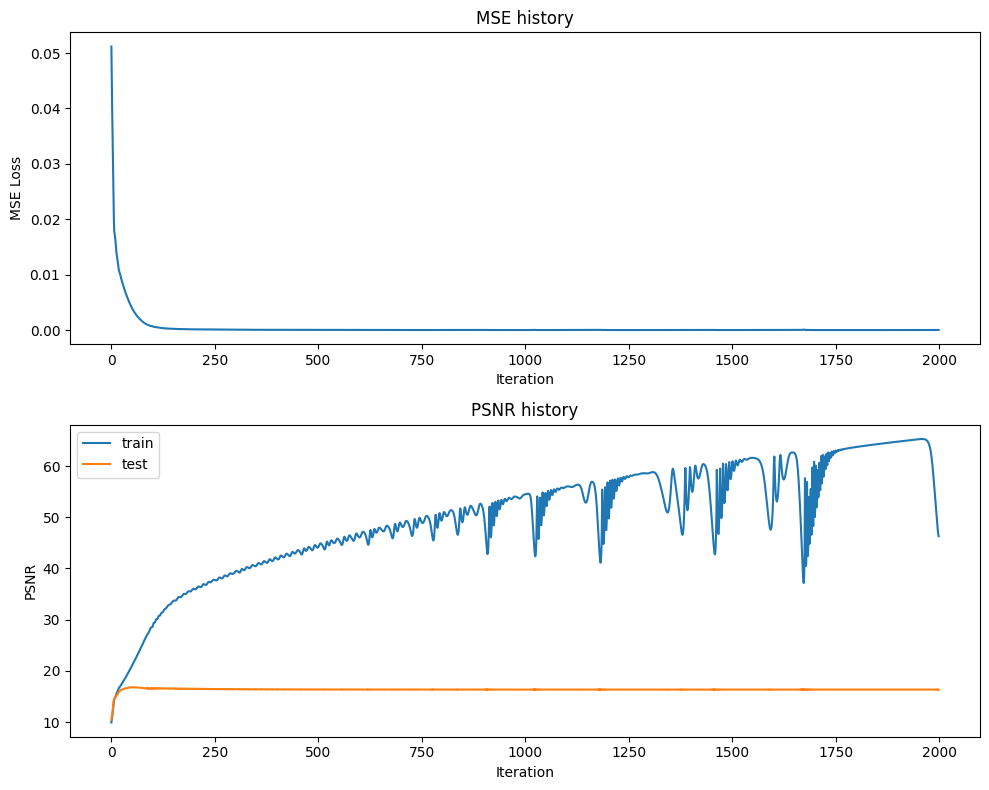

Final Test MSE 0.011700436022037441
Final Test psnr 16.30767958108107


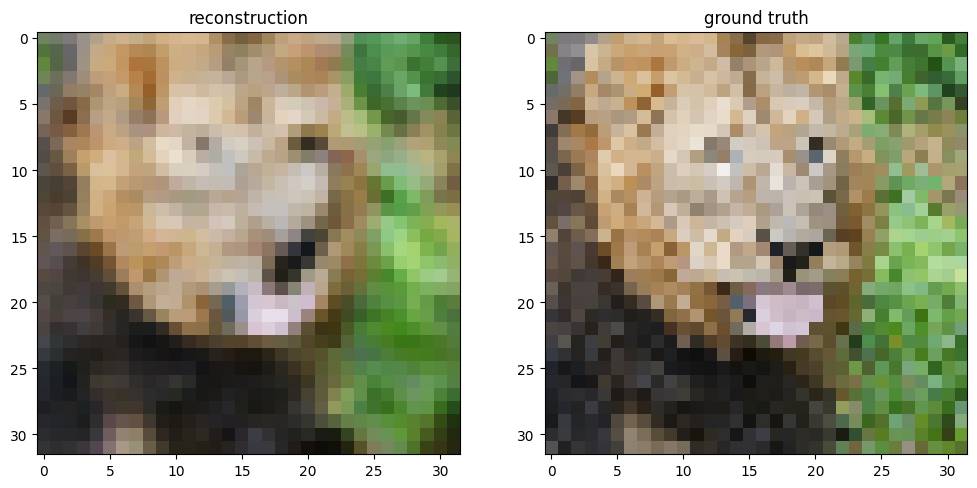

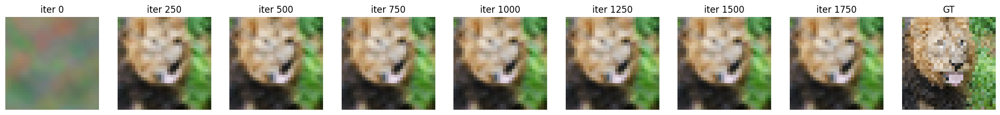

training gauss_10.0
Training: gauss_10.0
(256, 32)
(256, 3)
(1024, 32)
(1024, 3)
Input Size: 32


  0%|          | 0/2000 [00:00<?, ?it/s]

Epoch 0: Loss = 0.0544, Train PSNR = 9.63, Test PSNR = 9.94
Epoch 100: Loss = 0.0001, Train PSNR = 37.93, Test PSNR = 9.37
Epoch 200: Loss = 0.0000, Train PSNR = 51.64, Test PSNR = 9.33
Epoch 300: Loss = 0.0000, Train PSNR = 59.71, Test PSNR = 9.32
Epoch 400: Loss = 0.0000, Train PSNR = 68.05, Test PSNR = 9.32
Epoch 500: Loss = 0.0000, Train PSNR = 74.12, Test PSNR = 9.32
Epoch 600: Loss = 0.0000, Train PSNR = 80.01, Test PSNR = 9.32
Epoch 700: Loss = 0.0000, Train PSNR = 47.76, Test PSNR = 9.32
Epoch 800: Loss = 0.0000, Train PSNR = 94.25, Test PSNR = 9.33
Epoch 900: Loss = 0.0000, Train PSNR = 77.21, Test PSNR = 9.33
Epoch 1000: Loss = 0.0000, Train PSNR = 79.12, Test PSNR = 9.33
Epoch 1100: Loss = 0.0000, Train PSNR = 111.76, Test PSNR = 9.33
Epoch 1200: Loss = 0.0000, Train PSNR = 69.20, Test PSNR = 9.33
Epoch 1300: Loss = 0.0000, Train PSNR = 80.16, Test PSNR = 9.33
Epoch 1400: Loss = 0.0000, Train PSNR = 111.94, Test PSNR = 9.33
Epoch 1500: Loss = 0.0000, Train PSNR = 123.25, Tes

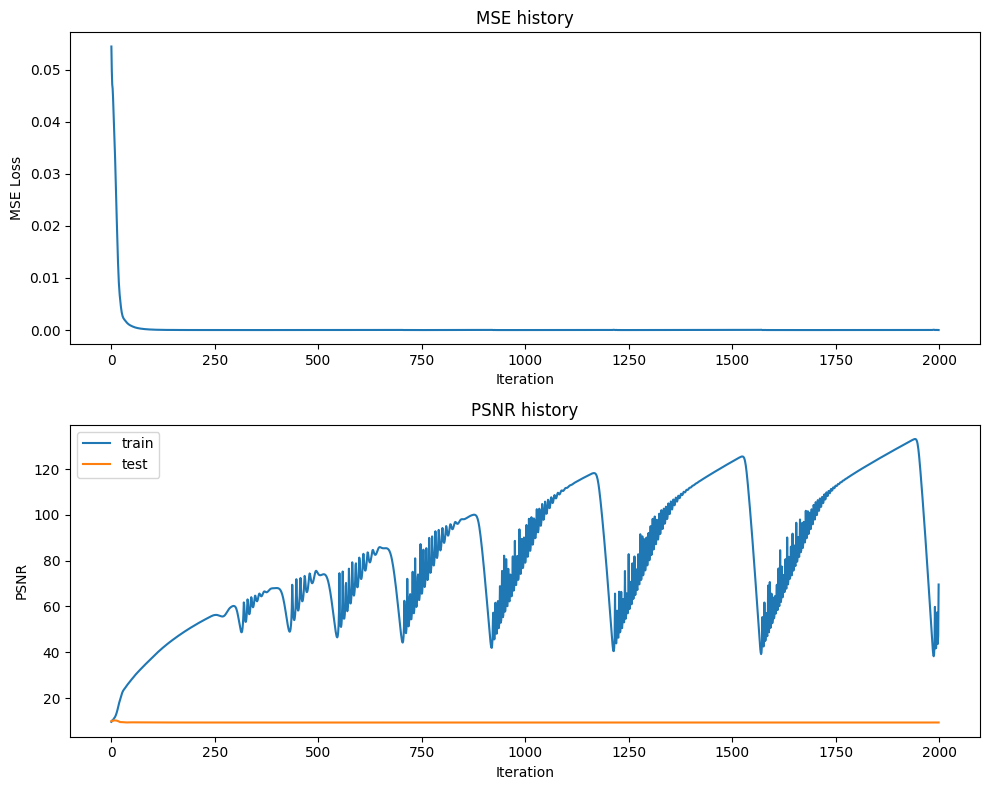

Final Test MSE 0.05814935675312114
Final Test psnr 9.344250894007883


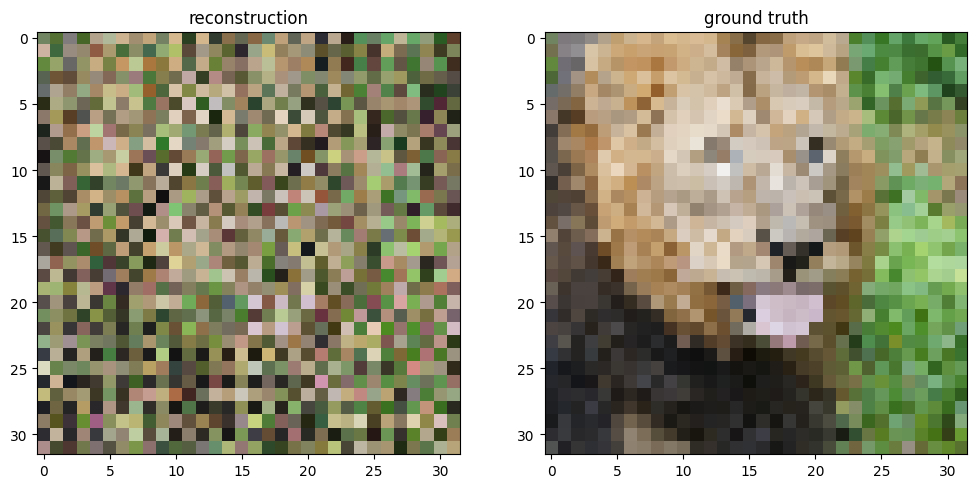

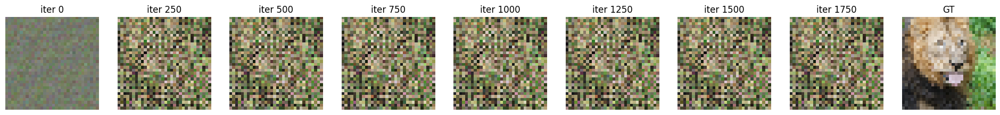

training gauss_100.0
Training: gauss_100.0
(256, 32)
(256, 3)
(1024, 32)
(1024, 3)
Input Size: 32


  0%|          | 0/2000 [00:00<?, ?it/s]

Epoch 0: Loss = 0.0584, Train PSNR = 9.33, Test PSNR = 9.80
Epoch 100: Loss = 0.0002, Train PSNR = 34.13, Test PSNR = 9.94
Epoch 200: Loss = 0.0000, Train PSNR = 44.63, Test PSNR = 9.88
Epoch 300: Loss = 0.0000, Train PSNR = 50.37, Test PSNR = 9.87
Epoch 400: Loss = 0.0000, Train PSNR = 55.55, Test PSNR = 9.86
Epoch 500: Loss = 0.0000, Train PSNR = 56.42, Test PSNR = 9.86
Epoch 600: Loss = 0.0000, Train PSNR = 63.34, Test PSNR = 9.86
Epoch 700: Loss = 0.0000, Train PSNR = 48.46, Test PSNR = 9.86
Epoch 800: Loss = 0.0000, Train PSNR = 69.67, Test PSNR = 9.86
Epoch 900: Loss = 0.0000, Train PSNR = 57.86, Test PSNR = 9.86
Epoch 1000: Loss = 0.0000, Train PSNR = 75.51, Test PSNR = 9.86
Epoch 1100: Loss = 0.0000, Train PSNR = 67.20, Test PSNR = 9.86
Epoch 1200: Loss = 0.0000, Train PSNR = 81.05, Test PSNR = 9.86
Epoch 1300: Loss = 0.0000, Train PSNR = 84.54, Test PSNR = 9.86
Epoch 1400: Loss = 0.0000, Train PSNR = 60.75, Test PSNR = 9.87
Epoch 1500: Loss = 0.0000, Train PSNR = 89.10, Test P

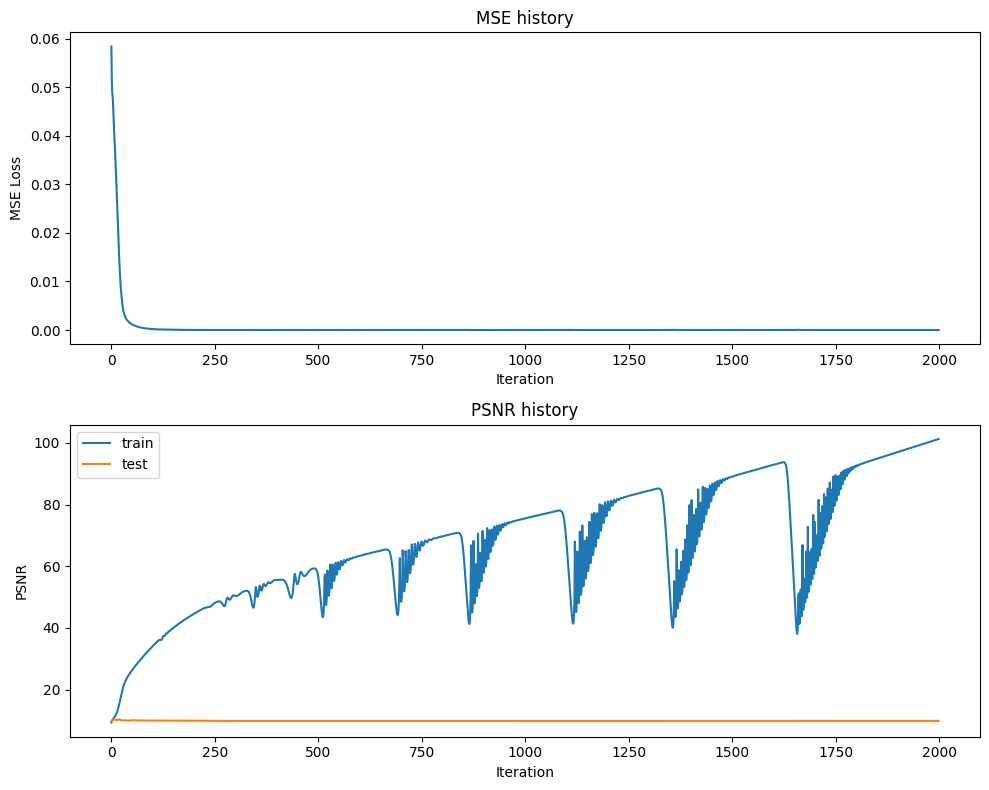

Final Test MSE 0.051460087529693006
Final Test psnr 9.87499483759197


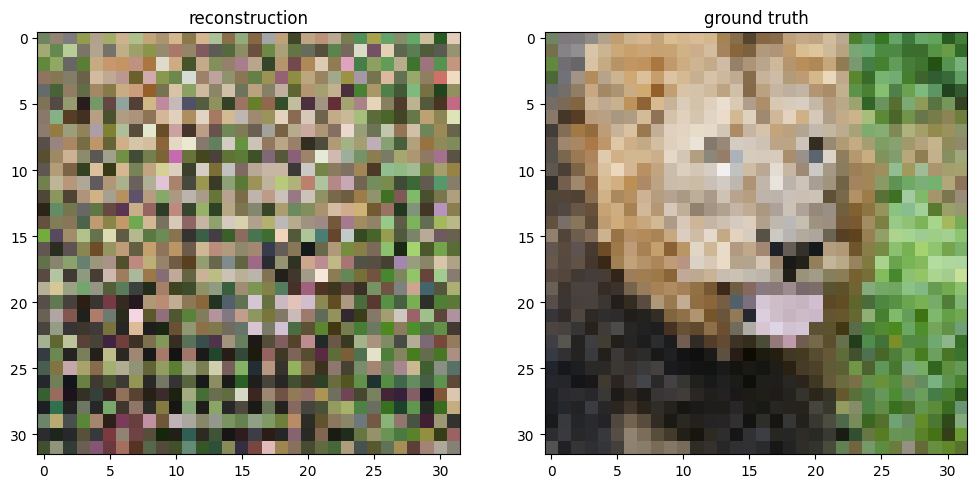

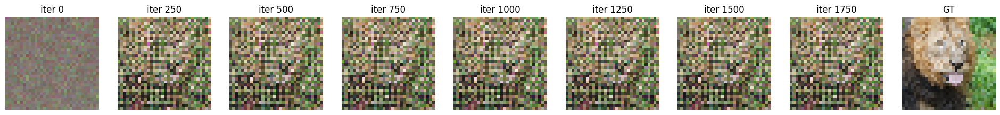

In [ ]:
# ADAM parameters
hidden_size = 64
epochs = 2000
learning_rate = 9e-4
output_size = 3

outputs = {}
for k in tqdm(B_dict):
  print("training", k)
  outputs[k] = train_wrapper(k, size, num_layers, hidden_size, output_size, epochs, learning_rate, opt='Adam')

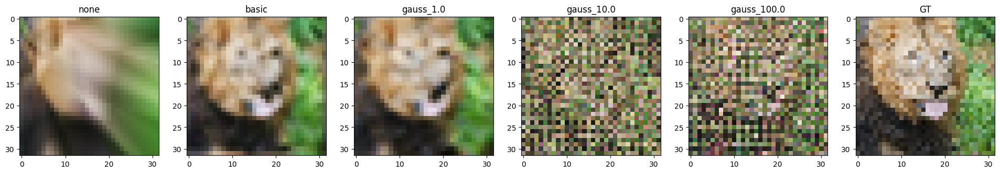

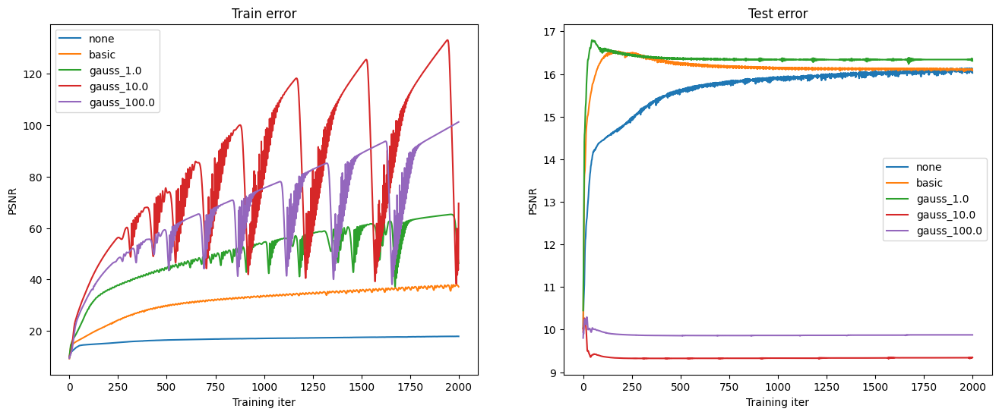

In [ ]:
plot_feature_mapping_comparison(outputs, y_test.reshape(size,size,3))

# High Resolution Reconstruction

#### High Resolution Reconstruction - SGD - Various Input Mapping Stategies

Repeat the previous experiment, but at the higher resolution. The reason why we have you first experiment with the lower resolution since it is faster to train and debug. Additionally, you will see how the mapping strategies perform better or worse at the two different input resolutions.

<ipython-input-6-47d50880e2e8>:6: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img = imageio.imread(image_url)[..., :3] / 255.


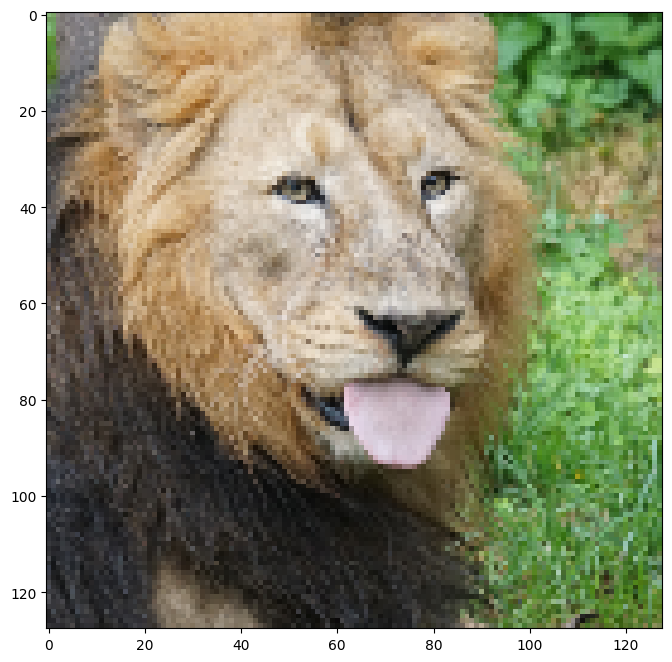

In [17]:
# load hi-res image
# SGD
hidden_size = 256
epochs = 3000
learning_rate = 0.1
output_size = 3

size = 128
train_data, test_data = get_image(size)

  0%|          | 0/5 [00:00<?, ?it/s]

training none
Training: none
(4096, 2)
(4096, 3)
(16384, 2)
(16384, 3)
Input Size: 2


  0%|          | 0/3000 [00:00<?, ?it/s]

Epoch 0: Loss = 0.0530, Train PSNR = 9.75, Test PSNR = 9.82
Epoch 100: Loss = 0.0338, Train PSNR = 11.70, Test PSNR = 11.72
Epoch 200: Loss = 0.0312, Train PSNR = 12.04, Test PSNR = 12.06
Epoch 300: Loss = 0.0297, Train PSNR = 12.26, Test PSNR = 12.28
Epoch 400: Loss = 0.0285, Train PSNR = 12.45, Test PSNR = 12.46
Epoch 500: Loss = 0.0274, Train PSNR = 12.61, Test PSNR = 12.63
Epoch 600: Loss = 0.0264, Train PSNR = 12.77, Test PSNR = 12.79
Epoch 700: Loss = 0.0256, Train PSNR = 12.91, Test PSNR = 12.93
Epoch 800: Loss = 0.0248, Train PSNR = 13.04, Test PSNR = 13.05
Epoch 900: Loss = 0.0242, Train PSNR = 13.15, Test PSNR = 13.17
Epoch 1000: Loss = 0.0236, Train PSNR = 13.26, Test PSNR = 13.27
Epoch 1100: Loss = 0.0232, Train PSNR = 13.34, Test PSNR = 13.35
Epoch 1200: Loss = 0.0228, Train PSNR = 13.42, Test PSNR = 13.42
Epoch 1300: Loss = 0.0224, Train PSNR = 13.48, Test PSNR = 13.49
Epoch 1400: Loss = 0.0222, Train PSNR = 13.53, Test PSNR = 13.54
Epoch 1500: Loss = 0.0219, Train PSNR =

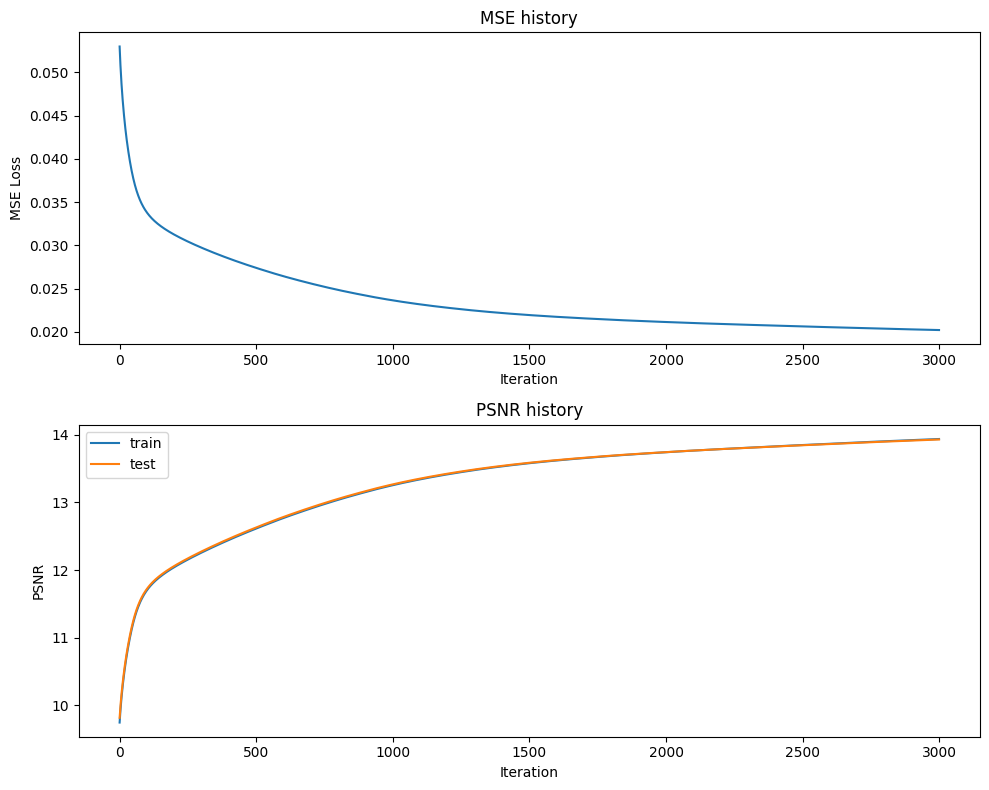

Final Test MSE 0.020228505744314795
Final Test psnr 13.930062011977657


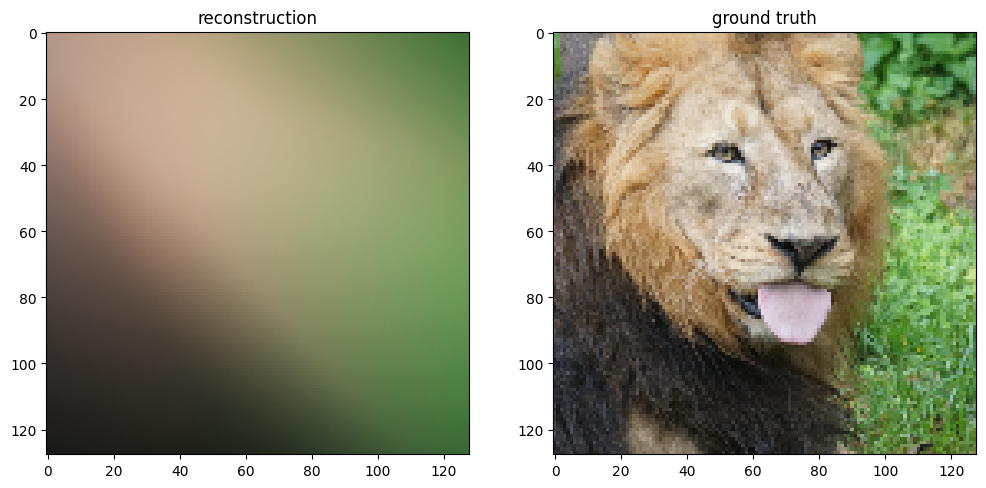

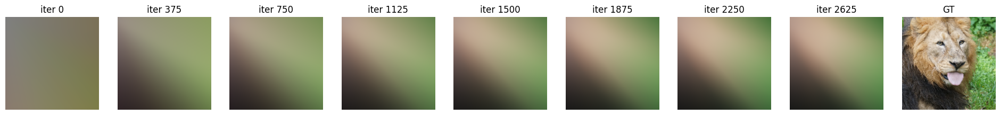

training basic
Training: basic
(4096, 4)
(4096, 3)
(16384, 4)
(16384, 3)
Input Size: 4


  0%|          | 0/3000 [00:00<?, ?it/s]

Epoch 0: Loss = 0.0549, Train PSNR = 9.60, Test PSNR = 9.72
Epoch 100: Loss = 0.0250, Train PSNR = 13.02, Test PSNR = 13.02
Epoch 200: Loss = 0.0206, Train PSNR = 13.86, Test PSNR = 13.85
Epoch 300: Loss = 0.0188, Train PSNR = 14.24, Test PSNR = 14.23
Epoch 400: Loss = 0.0178, Train PSNR = 14.49, Test PSNR = 14.47
Epoch 500: Loss = 0.0171, Train PSNR = 14.67, Test PSNR = 14.65
Epoch 600: Loss = 0.0165, Train PSNR = 14.81, Test PSNR = 14.79
Epoch 700: Loss = 0.0161, Train PSNR = 14.93, Test PSNR = 14.90
Epoch 800: Loss = 0.0157, Train PSNR = 15.02, Test PSNR = 15.00
Epoch 900: Loss = 0.0154, Train PSNR = 15.11, Test PSNR = 15.09
Epoch 1000: Loss = 0.0151, Train PSNR = 15.19, Test PSNR = 15.16
Epoch 1100: Loss = 0.0149, Train PSNR = 15.26, Test PSNR = 15.23
Epoch 1200: Loss = 0.0147, Train PSNR = 15.32, Test PSNR = 15.29
Epoch 1300: Loss = 0.0145, Train PSNR = 15.38, Test PSNR = 15.35
Epoch 1400: Loss = 0.0143, Train PSNR = 15.43, Test PSNR = 15.40
Epoch 1500: Loss = 0.0142, Train PSNR =

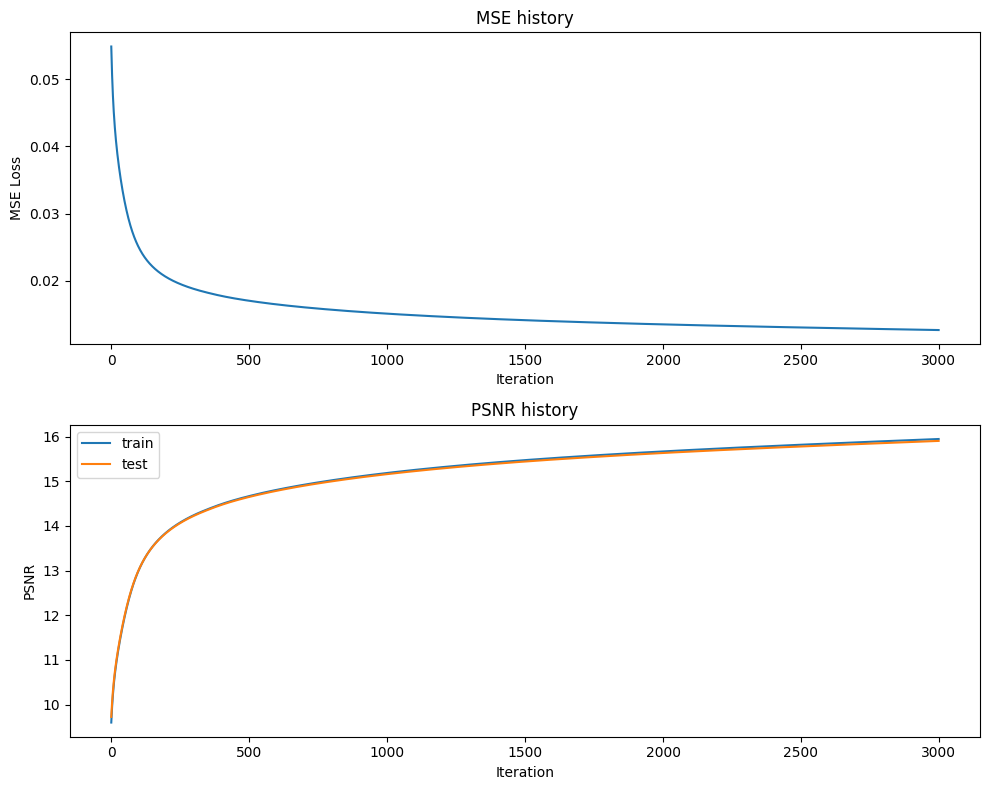

Final Test MSE 0.012835534297802187
Final Test psnr 15.905560528121905


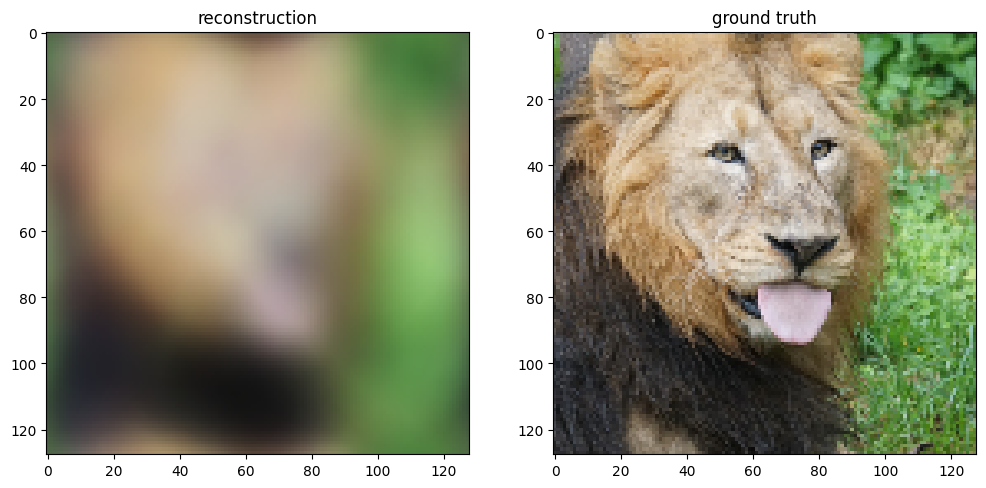

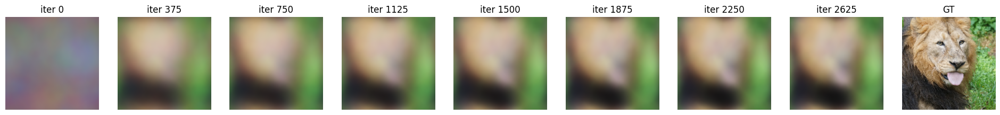

training gauss_1.0
Training: gauss_1.0
(4096, 128)
(4096, 3)
(16384, 128)
(16384, 3)
Input Size: 128


  0%|          | 0/3000 [00:00<?, ?it/s]

Epoch 0: Loss = 0.0629, Train PSNR = 9.00, Test PSNR = 9.21
Epoch 100: Loss = 0.0193, Train PSNR = 14.14, Test PSNR = 14.13
Epoch 200: Loss = 0.0159, Train PSNR = 14.99, Test PSNR = 14.95
Epoch 300: Loss = 0.0145, Train PSNR = 15.36, Test PSNR = 15.32
Epoch 400: Loss = 0.0138, Train PSNR = 15.60, Test PSNR = 15.56
Epoch 500: Loss = 0.0132, Train PSNR = 15.78, Test PSNR = 15.74
Epoch 600: Loss = 0.0128, Train PSNR = 15.92, Test PSNR = 15.88
Epoch 700: Loss = 0.0124, Train PSNR = 16.04, Test PSNR = 16.00
Epoch 800: Loss = 0.0121, Train PSNR = 16.15, Test PSNR = 16.10
Epoch 900: Loss = 0.0119, Train PSNR = 16.24, Test PSNR = 16.19
Epoch 1000: Loss = 0.0117, Train PSNR = 16.32, Test PSNR = 16.27
Epoch 1100: Loss = 0.0115, Train PSNR = 16.39, Test PSNR = 16.34
Epoch 1200: Loss = 0.0113, Train PSNR = 16.46, Test PSNR = 16.41
Epoch 1300: Loss = 0.0111, Train PSNR = 16.52, Test PSNR = 16.47
Epoch 1400: Loss = 0.0110, Train PSNR = 16.58, Test PSNR = 16.53
Epoch 1500: Loss = 0.0109, Train PSNR =

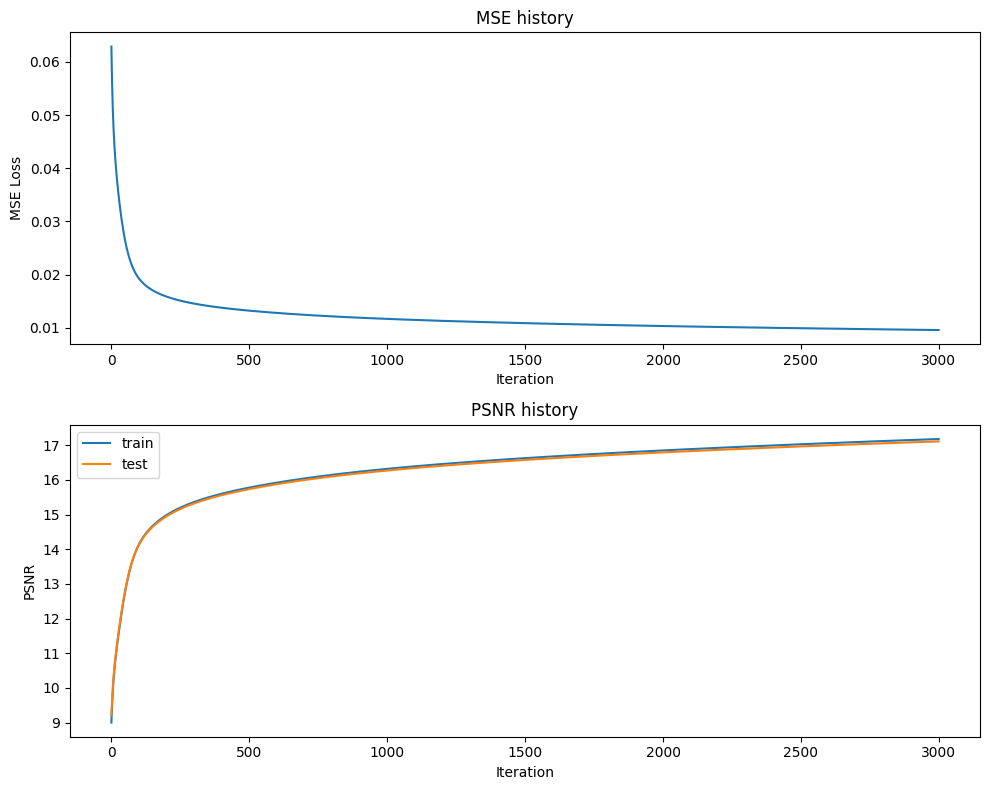

Final Test MSE 0.009723651344399125
Final Test psnr 17.11140626143144


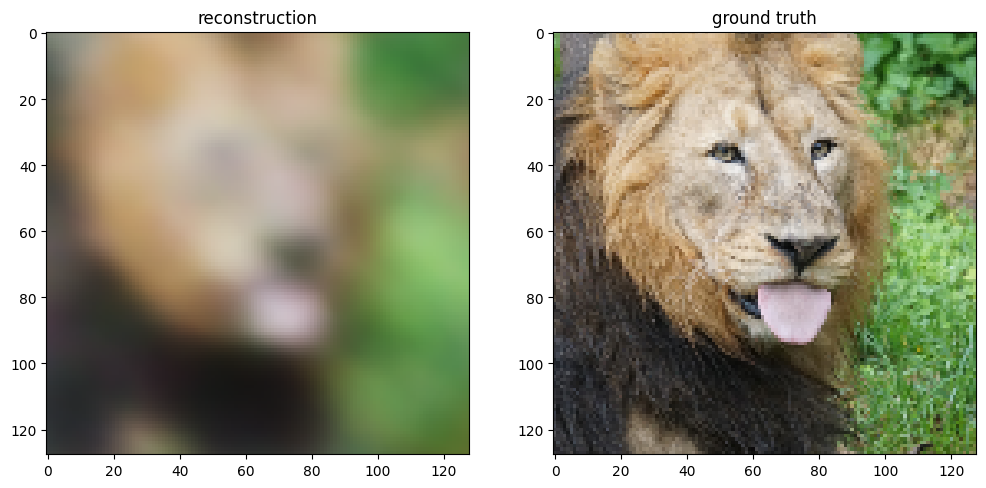

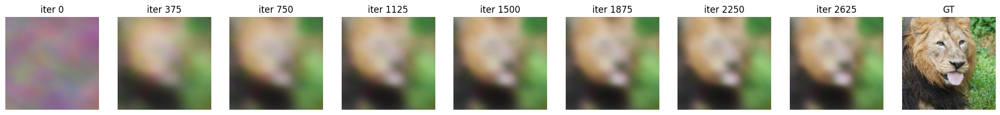

training gauss_10.0
Training: gauss_10.0
(4096, 128)
(4096, 3)
(16384, 128)
(16384, 3)
Input Size: 128


  0%|          | 0/3000 [00:00<?, ?it/s]

Epoch 0: Loss = 0.0597, Train PSNR = 9.23, Test PSNR = 9.32
Epoch 100: Loss = 0.0477, Train PSNR = 10.20, Test PSNR = 10.21
Epoch 200: Loss = 0.0449, Train PSNR = 10.47, Test PSNR = 10.47
Epoch 300: Loss = 0.0417, Train PSNR = 10.78, Test PSNR = 10.77
Epoch 400: Loss = 0.0383, Train PSNR = 11.16, Test PSNR = 11.14
Epoch 500: Loss = 0.0348, Train PSNR = 11.58, Test PSNR = 11.55
Epoch 600: Loss = 0.0316, Train PSNR = 12.00, Test PSNR = 11.95
Epoch 700: Loss = 0.0289, Train PSNR = 12.39, Test PSNR = 12.32
Epoch 800: Loss = 0.0266, Train PSNR = 12.73, Test PSNR = 12.64
Epoch 900: Loss = 0.0249, Train PSNR = 13.03, Test PSNR = 12.92
Epoch 1000: Loss = 0.0234, Train PSNR = 13.30, Test PSNR = 13.16
Epoch 1100: Loss = 0.0221, Train PSNR = 13.55, Test PSNR = 13.38
Epoch 1200: Loss = 0.0209, Train PSNR = 13.78, Test PSNR = 13.59
Epoch 1300: Loss = 0.0199, Train PSNR = 14.00, Test PSNR = 13.78
Epoch 1400: Loss = 0.0189, Train PSNR = 14.22, Test PSNR = 13.97
Epoch 1500: Loss = 0.0180, Train PSNR =

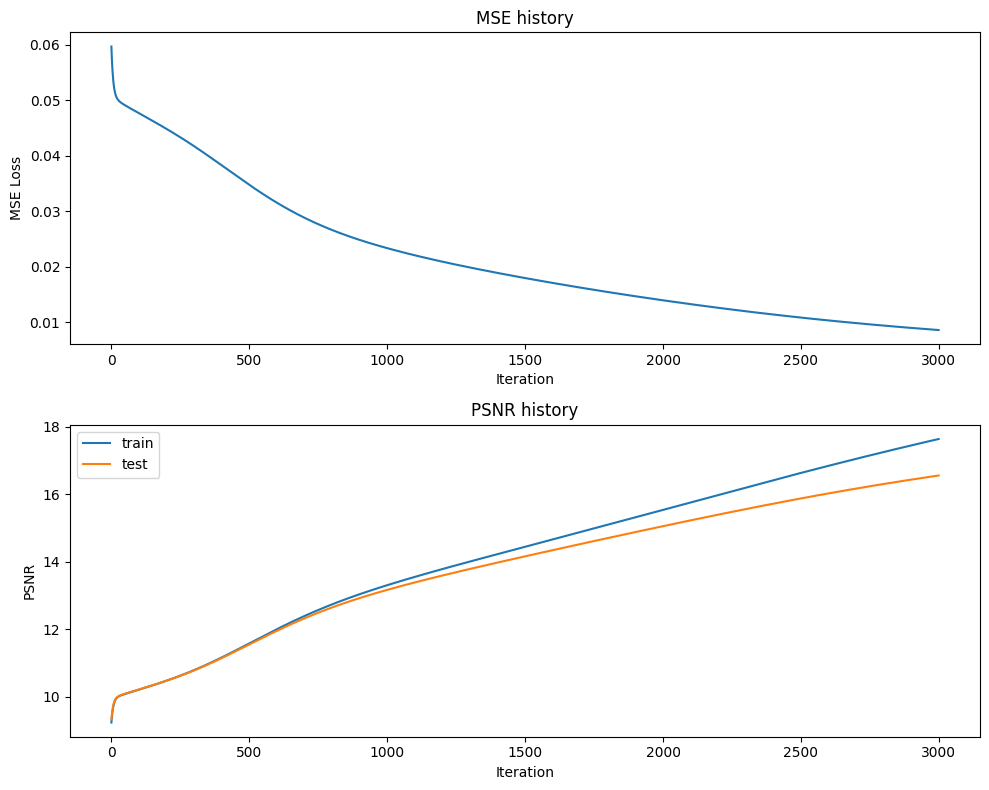

Final Test MSE 0.01105272283745757
Final Test psnr 16.55500724720776


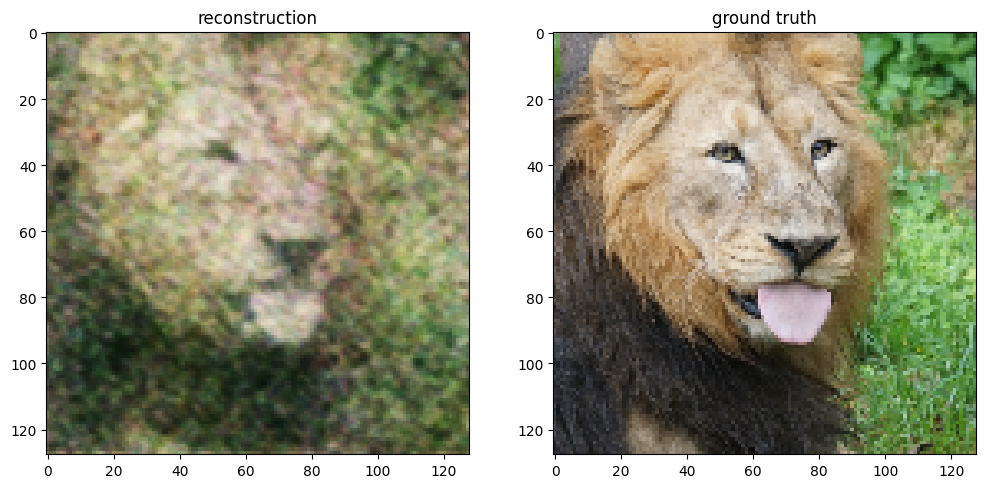

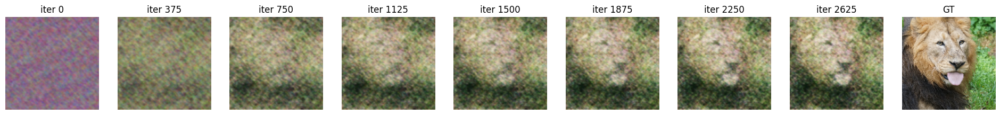

training gauss_100.0
Training: gauss_100.0
(4096, 128)
(4096, 3)
(16384, 128)
(16384, 3)
Input Size: 128


  0%|          | 0/3000 [00:00<?, ?it/s]

Epoch 0: Loss = 0.0636, Train PSNR = 8.95, Test PSNR = 9.08
Epoch 100: Loss = 0.0510, Train PSNR = 9.92, Test PSNR = 9.90
Epoch 200: Loss = 0.0506, Train PSNR = 9.95, Test PSNR = 9.92
Epoch 300: Loss = 0.0502, Train PSNR = 9.98, Test PSNR = 9.94
Epoch 400: Loss = 0.0499, Train PSNR = 10.01, Test PSNR = 9.95
Epoch 500: Loss = 0.0496, Train PSNR = 10.04, Test PSNR = 9.96
Epoch 600: Loss = 0.0493, Train PSNR = 10.06, Test PSNR = 9.97
Epoch 700: Loss = 0.0491, Train PSNR = 10.08, Test PSNR = 9.97
Epoch 800: Loss = 0.0488, Train PSNR = 10.10, Test PSNR = 9.98
Epoch 900: Loss = 0.0486, Train PSNR = 10.12, Test PSNR = 9.98
Epoch 1000: Loss = 0.0484, Train PSNR = 10.14, Test PSNR = 9.99
Epoch 1100: Loss = 0.0481, Train PSNR = 10.17, Test PSNR = 9.99
Epoch 1200: Loss = 0.0479, Train PSNR = 10.19, Test PSNR = 9.99
Epoch 1300: Loss = 0.0476, Train PSNR = 10.21, Test PSNR = 10.00
Epoch 1400: Loss = 0.0473, Train PSNR = 10.24, Test PSNR = 10.00
Epoch 1500: Loss = 0.0470, Train PSNR = 10.27, Test PS

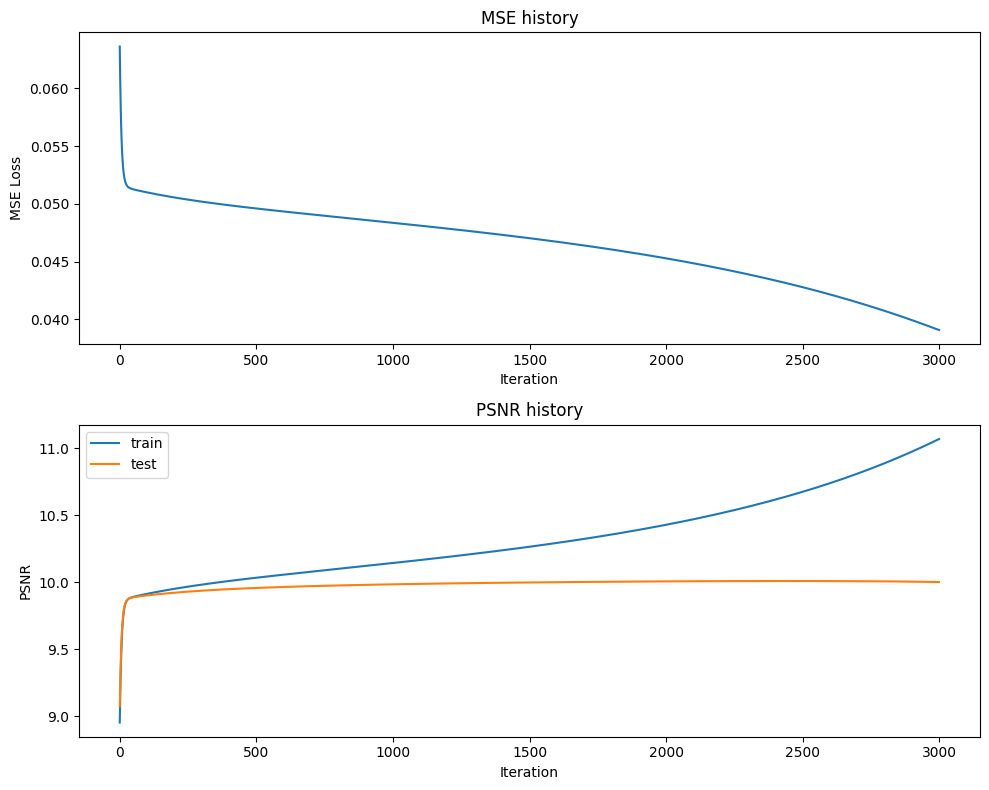

Final Test MSE 0.04996524708338932
Final Test psnr 10.003019649520702


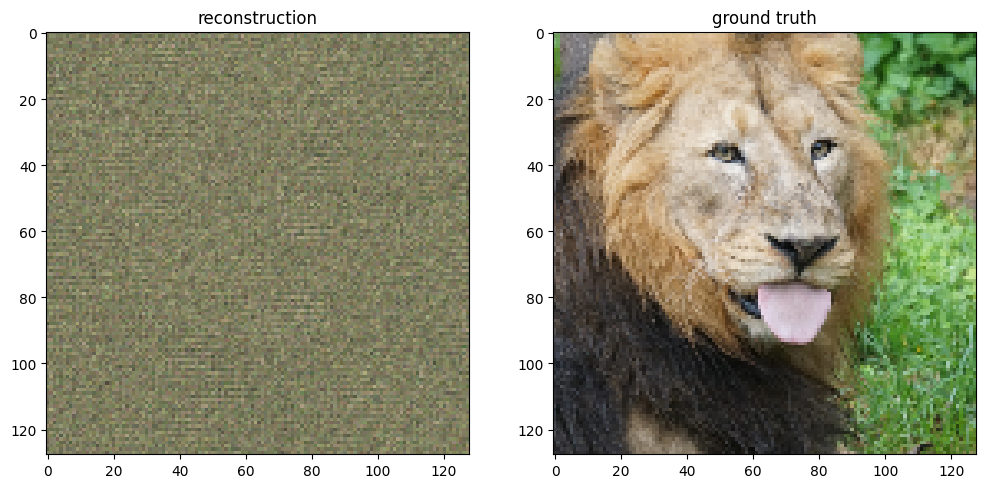

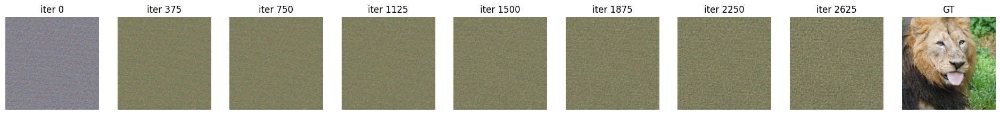

In [18]:
outputs = {}
for k in tqdm(B_dict):
  print("training", k)
  outputs[k] = train_wrapper(k,size, num_layers, hidden_size, output_size, epochs, learning_rate, opt='SGD')

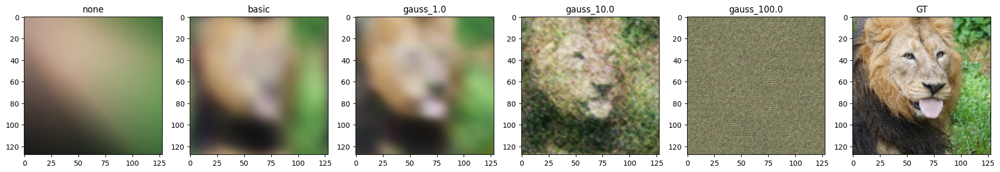

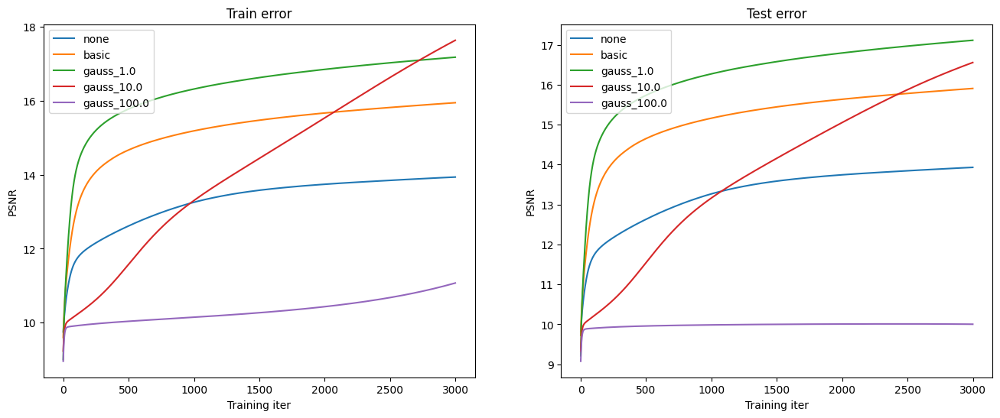

In [19]:
X_train, y_train, X_test, y_test = get_input_features(get_B_dict(size), "none")  # for getting y_test

# if you did everything correctly so far, this should output a nice figure you can use in your report
plot_feature_mapping_comparison(outputs, y_test.reshape(size,size,3))

#### High Resolution Reconstruction - Adam - Various Input Mapping Stategies

  0%|          | 0/5 [00:00<?, ?it/s]

training none
Training: none
(4096, 2)
(4096, 3)
(16384, 2)
(16384, 3)
Input Size: 2


  0%|          | 0/2000 [00:00<?, ?it/s]

Epoch 0: Loss = 0.0561, Train PSNR = 9.50, Test PSNR = 9.95
Epoch 100: Loss = 0.0171, Train PSNR = 14.65, Test PSNR = 14.63
Epoch 200: Loss = 0.0148, Train PSNR = 15.30, Test PSNR = 15.27
Epoch 300: Loss = 0.0132, Train PSNR = 15.80, Test PSNR = 15.76
Epoch 400: Loss = 0.0126, Train PSNR = 15.99, Test PSNR = 15.94
Epoch 500: Loss = 0.0123, Train PSNR = 16.10, Test PSNR = 16.06
Epoch 600: Loss = 0.0120, Train PSNR = 16.20, Test PSNR = 16.15
Epoch 700: Loss = 0.0118, Train PSNR = 16.29, Test PSNR = 16.23
Epoch 800: Loss = 0.0116, Train PSNR = 16.36, Test PSNR = 16.30
Epoch 900: Loss = 0.0114, Train PSNR = 16.43, Test PSNR = 16.37
Epoch 1000: Loss = 0.0112, Train PSNR = 16.50, Test PSNR = 16.44
Epoch 1100: Loss = 0.0110, Train PSNR = 16.57, Test PSNR = 16.51
Epoch 1200: Loss = 0.0108, Train PSNR = 16.64, Test PSNR = 16.58
Epoch 1300: Loss = 0.0106, Train PSNR = 16.74, Test PSNR = 16.67
Epoch 1400: Loss = 0.0104, Train PSNR = 16.80, Test PSNR = 16.74
Epoch 1500: Loss = 0.0103, Train PSNR =

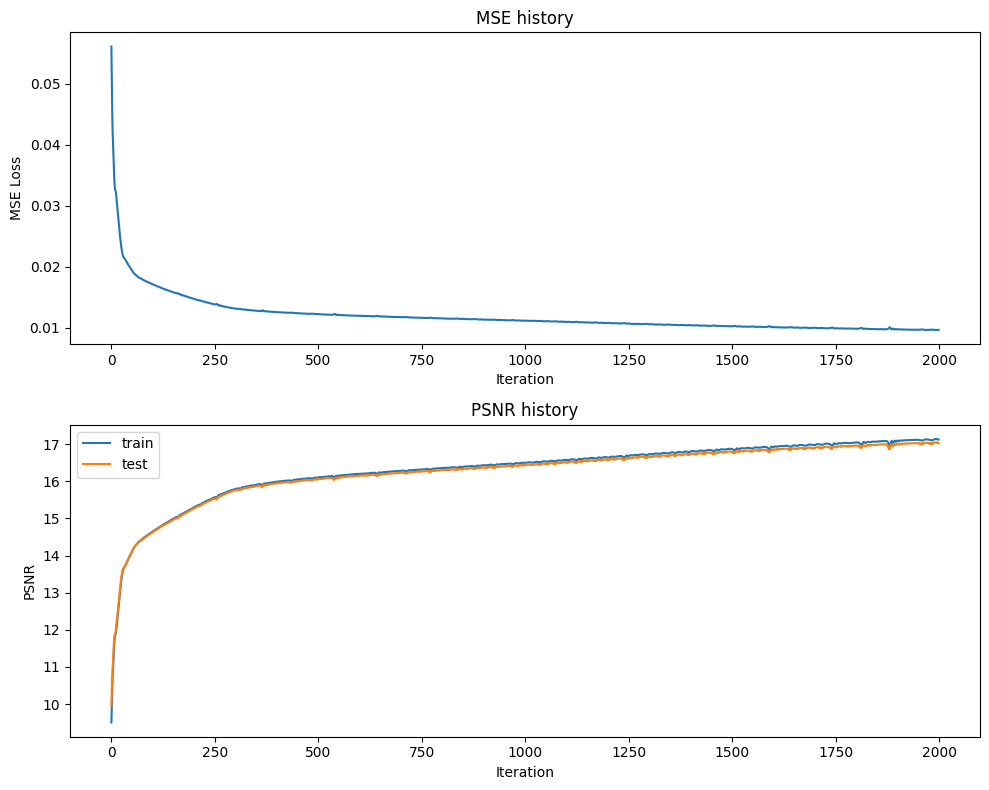

Final Test MSE 0.00991232572032104
Final Test psnr 17.02794439759994


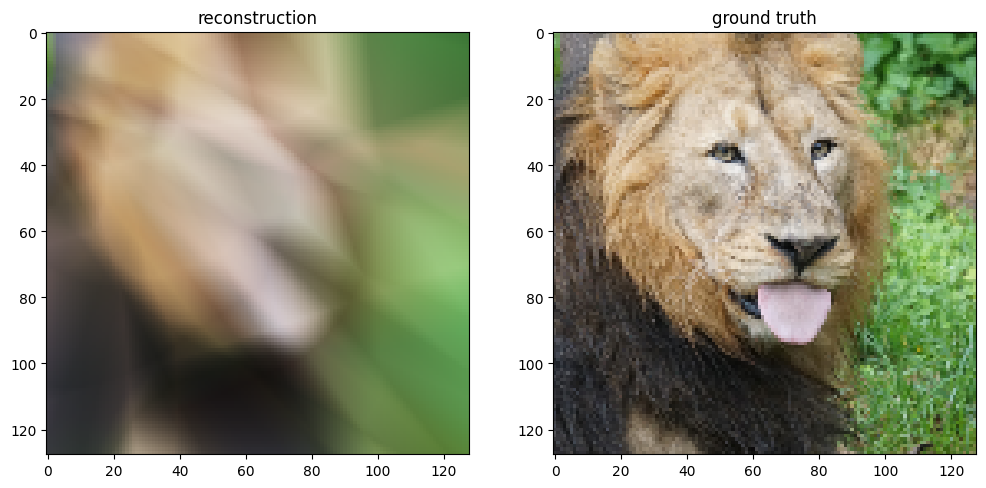

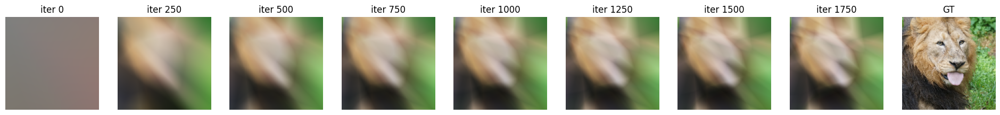

training basic
Training: basic
(4096, 4)
(4096, 3)
(16384, 4)
(16384, 3)
Input Size: 4


  0%|          | 0/2000 [00:00<?, ?it/s]

Epoch 0: Loss = 0.0566, Train PSNR = 9.46, Test PSNR = 10.08
Epoch 100: Loss = 0.0106, Train PSNR = 16.72, Test PSNR = 16.68
Epoch 200: Loss = 0.0087, Train PSNR = 17.61, Test PSNR = 17.48
Epoch 300: Loss = 0.0078, Train PSNR = 18.09, Test PSNR = 17.89
Epoch 400: Loss = 0.0072, Train PSNR = 18.44, Test PSNR = 18.17
Epoch 500: Loss = 0.0067, Train PSNR = 18.72, Test PSNR = 18.37
Epoch 600: Loss = 0.0064, Train PSNR = 18.93, Test PSNR = 18.49
Epoch 700: Loss = 0.0061, Train PSNR = 19.11, Test PSNR = 18.60
Epoch 800: Loss = 0.0059, Train PSNR = 19.26, Test PSNR = 18.73
Epoch 900: Loss = 0.0057, Train PSNR = 19.42, Test PSNR = 18.78
Epoch 1000: Loss = 0.0055, Train PSNR = 19.55, Test PSNR = 18.89
Epoch 1100: Loss = 0.0054, Train PSNR = 19.66, Test PSNR = 18.96
Epoch 1200: Loss = 0.0053, Train PSNR = 19.75, Test PSNR = 18.97
Epoch 1300: Loss = 0.0052, Train PSNR = 19.80, Test PSNR = 19.00
Epoch 1400: Loss = 0.0051, Train PSNR = 19.90, Test PSNR = 19.07
Epoch 1500: Loss = 0.0050, Train PSNR 

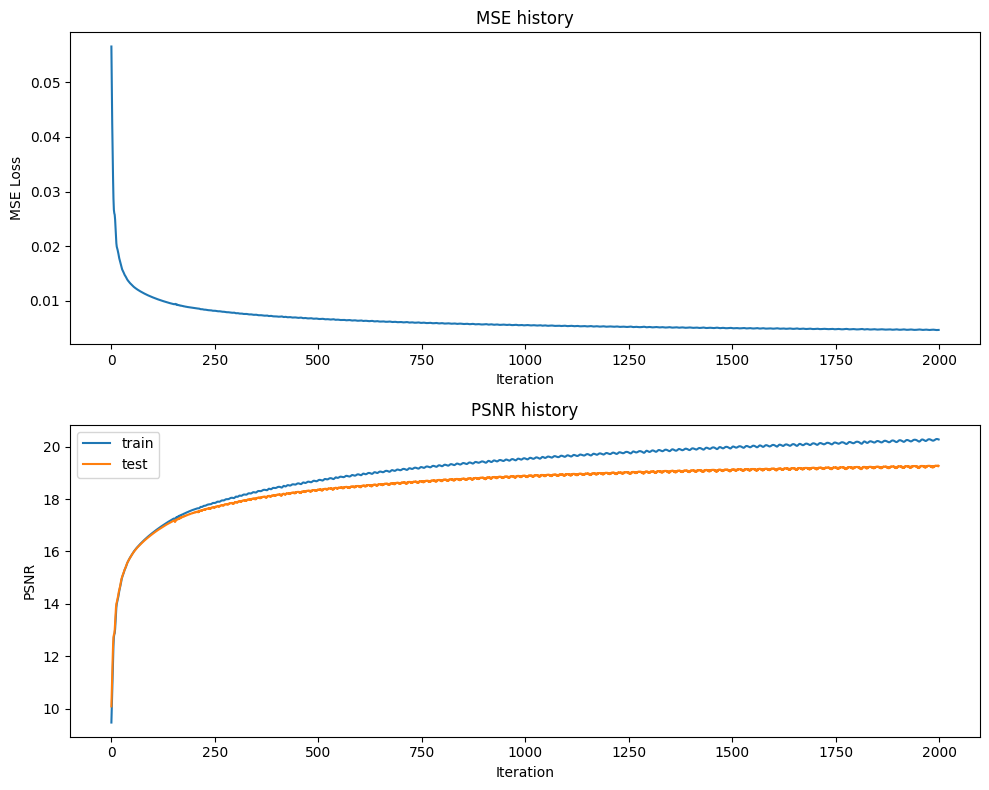

Final Test MSE 0.005916684075481977
Final Test psnr 19.268916238266016


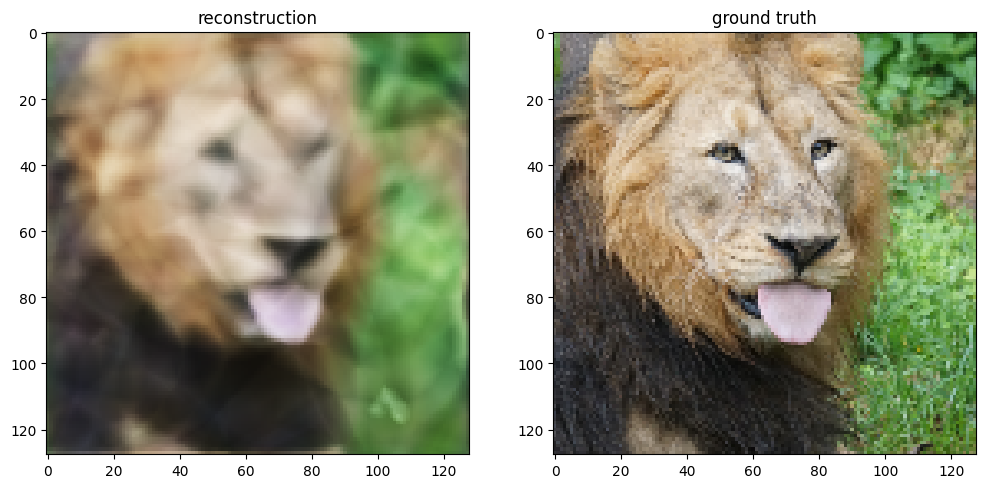

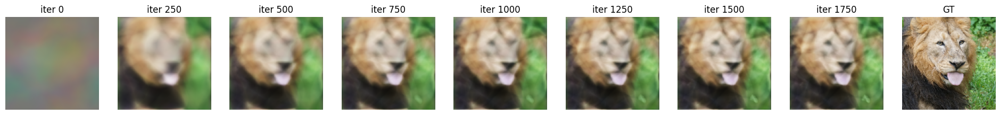

training gauss_1.0
Training: gauss_1.0
(4096, 128)
(4096, 3)
(16384, 128)
(16384, 3)
Input Size: 128


  0%|          | 0/2000 [00:00<?, ?it/s]

Epoch 0: Loss = 0.0556, Train PSNR = 9.54, Test PSNR = 10.35
Epoch 100: Loss = 0.0077, Train PSNR = 18.13, Test PSNR = 18.03
Epoch 200: Loss = 0.0057, Train PSNR = 19.40, Test PSNR = 19.06
Epoch 300: Loss = 0.0050, Train PSNR = 20.02, Test PSNR = 19.39
Epoch 400: Loss = 0.0044, Train PSNR = 20.55, Test PSNR = 19.71
Epoch 500: Loss = 0.0041, Train PSNR = 20.83, Test PSNR = 19.84
Epoch 600: Loss = 0.0038, Train PSNR = 21.15, Test PSNR = 19.99
Epoch 700: Loss = 0.0036, Train PSNR = 21.44, Test PSNR = 20.10
Epoch 800: Loss = 0.0035, Train PSNR = 21.59, Test PSNR = 20.13
Epoch 900: Loss = 0.0033, Train PSNR = 21.76, Test PSNR = 20.21
Epoch 1000: Loss = 0.0033, Train PSNR = 21.86, Test PSNR = 20.21
Epoch 1100: Loss = 0.0031, Train PSNR = 22.01, Test PSNR = 20.19
Epoch 1200: Loss = 0.0031, Train PSNR = 22.08, Test PSNR = 20.24
Epoch 1300: Loss = 0.0029, Train PSNR = 22.37, Test PSNR = 20.34
Epoch 1400: Loss = 0.0028, Train PSNR = 22.54, Test PSNR = 20.37
Epoch 1500: Loss = 0.0028, Train PSNR 

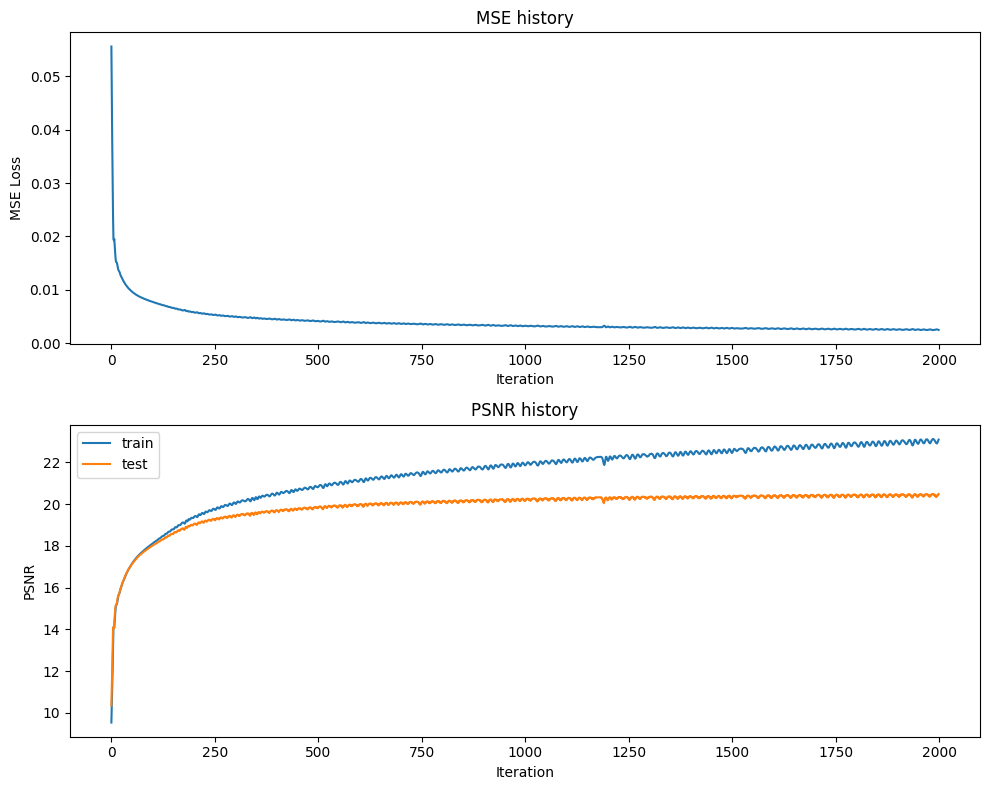

Final Test MSE 0.004468035208897038
Final Test psnr 20.48853417562669


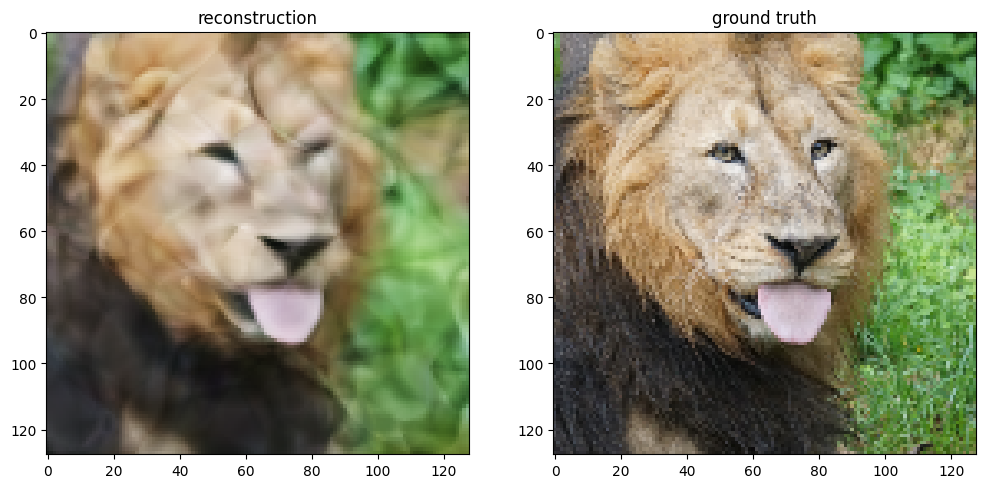

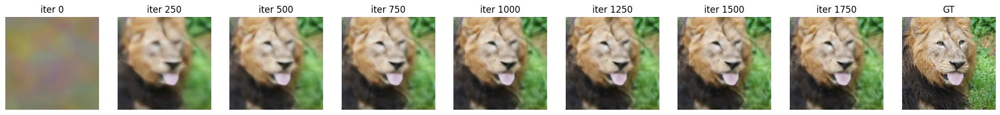

training gauss_10.0
Training: gauss_10.0
(4096, 128)
(4096, 3)
(16384, 128)
(16384, 3)
Input Size: 128


  0%|          | 0/2000 [00:00<?, ?it/s]

Epoch 0: Loss = 0.0590, Train PSNR = 9.28, Test PSNR = 9.78
Epoch 100: Loss = 0.0014, Train PSNR = 25.67, Test PSNR = 19.45
Epoch 200: Loss = 0.0007, Train PSNR = 28.82, Test PSNR = 19.59
Epoch 300: Loss = 0.0004, Train PSNR = 30.67, Test PSNR = 19.59
Epoch 400: Loss = 0.0003, Train PSNR = 31.93, Test PSNR = 19.55
Epoch 500: Loss = 0.0002, Train PSNR = 33.05, Test PSNR = 19.52
Epoch 600: Loss = 0.0002, Train PSNR = 34.02, Test PSNR = 19.48
Epoch 700: Loss = 0.0002, Train PSNR = 34.83, Test PSNR = 19.44
Epoch 800: Loss = 0.0001, Train PSNR = 35.47, Test PSNR = 19.41
Epoch 900: Loss = 0.0001, Train PSNR = 36.08, Test PSNR = 19.37
Epoch 1000: Loss = 0.0001, Train PSNR = 36.65, Test PSNR = 19.34
Epoch 1100: Loss = 0.0001, Train PSNR = 37.40, Test PSNR = 19.31
Epoch 1200: Loss = 0.0001, Train PSNR = 37.61, Test PSNR = 19.29
Epoch 1300: Loss = 0.0001, Train PSNR = 38.33, Test PSNR = 19.26
Epoch 1400: Loss = 0.0001, Train PSNR = 38.49, Test PSNR = 19.24
Epoch 1500: Loss = 0.0001, Train PSNR =

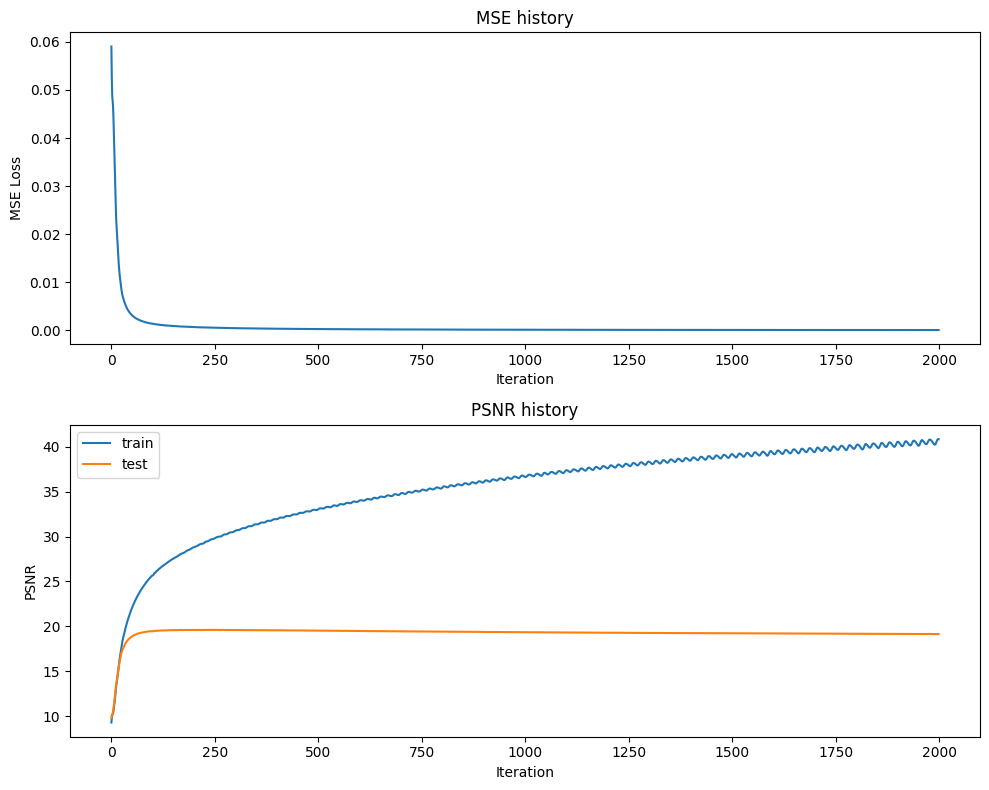

Final Test MSE 0.006096982070004769
Final Test psnr 19.138550864847467


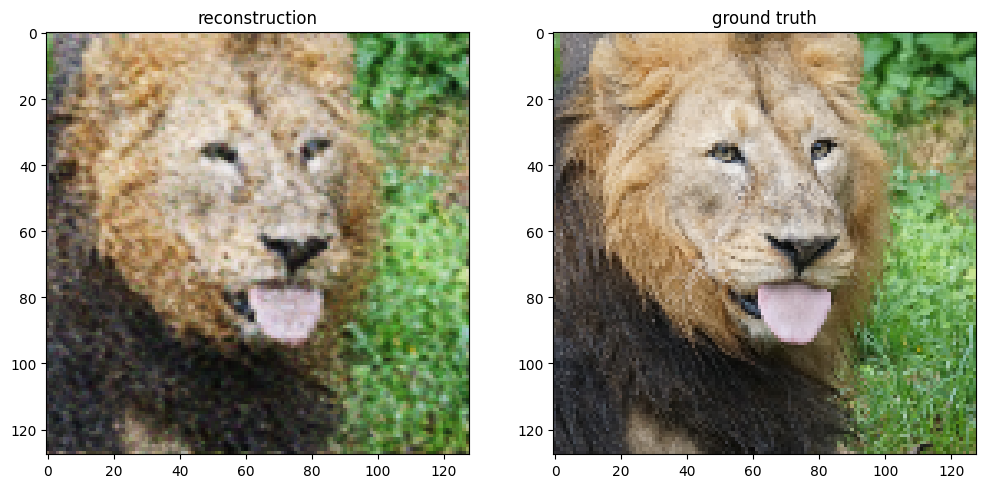

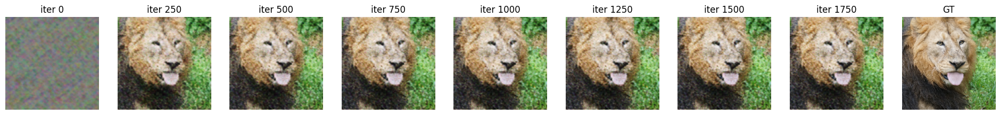

training gauss_100.0
Training: gauss_100.0
(4096, 128)
(4096, 3)
(16384, 128)
(16384, 3)
Input Size: 128


  0%|          | 0/2000 [00:00<?, ?it/s]

Epoch 0: Loss = 0.0595, Train PSNR = 9.24, Test PSNR = 9.76
Epoch 100: Loss = 0.0026, Train PSNR = 22.82, Test PSNR = 8.31
Epoch 200: Loss = 0.0018, Train PSNR = 24.45, Test PSNR = 8.20
Epoch 300: Loss = 0.0013, Train PSNR = 25.78, Test PSNR = 8.10
Epoch 400: Loss = 0.0010, Train PSNR = 26.93, Test PSNR = 8.02
Epoch 500: Loss = 0.0008, Train PSNR = 28.02, Test PSNR = 7.97
Epoch 600: Loss = 0.0006, Train PSNR = 29.02, Test PSNR = 7.92
Epoch 700: Loss = 0.0005, Train PSNR = 29.74, Test PSNR = 7.88
Epoch 800: Loss = 0.0004, Train PSNR = 30.55, Test PSNR = 7.85
Epoch 900: Loss = 0.0004, Train PSNR = 31.25, Test PSNR = 7.83
Epoch 1000: Loss = 0.0003, Train PSNR = 31.70, Test PSNR = 7.80
Epoch 1100: Loss = 0.0003, Train PSNR = 32.37, Test PSNR = 7.79
Epoch 1200: Loss = 0.0003, Train PSNR = 32.80, Test PSNR = 7.77
Epoch 1300: Loss = 0.0002, Train PSNR = 33.47, Test PSNR = 7.76
Epoch 1400: Loss = 0.0002, Train PSNR = 33.82, Test PSNR = 7.75
Epoch 1500: Loss = 0.0002, Train PSNR = 34.21, Test P

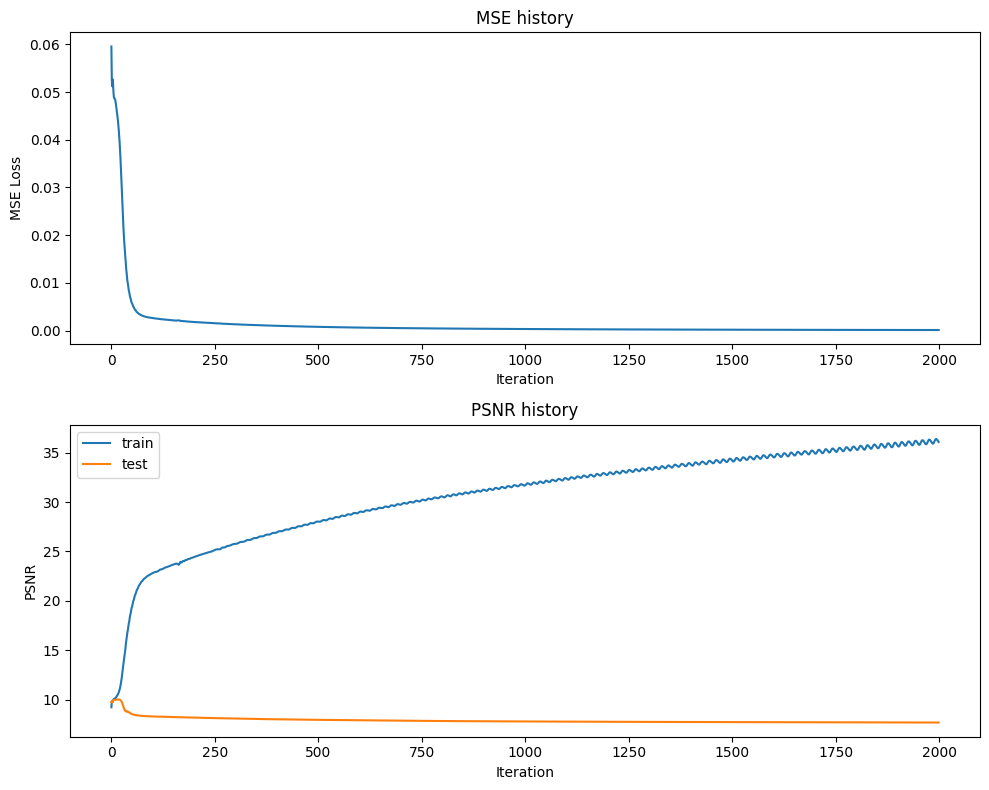

Final Test MSE 0.08494896366109683
Final Test psnr 7.698119192947258


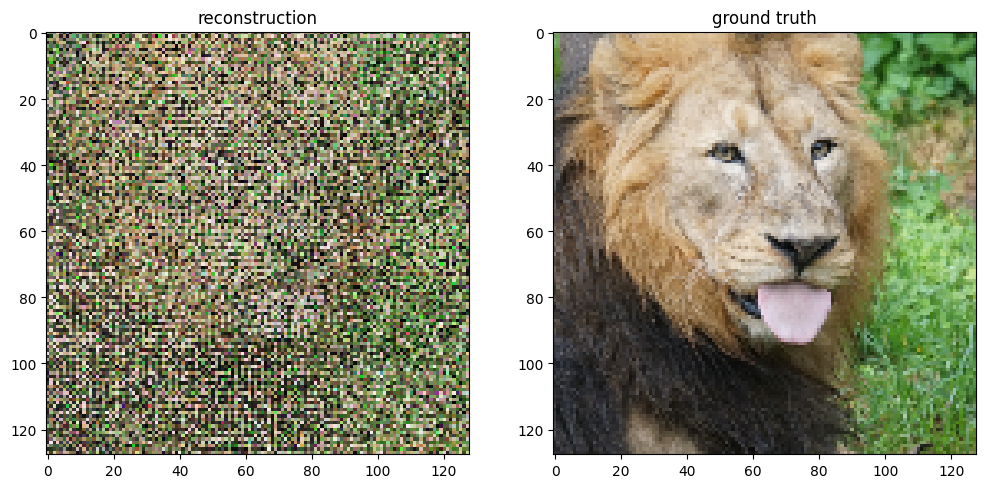

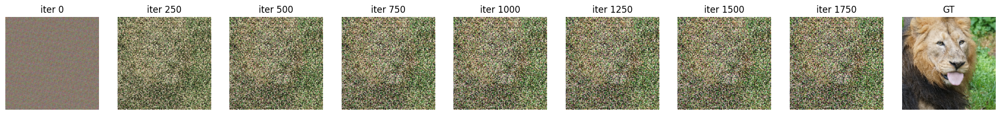

In [20]:
# ADAM parameters
hidden_size = 64
epochs = 2000
learning_rate = 9e-4
output_size = 3

outputs = {}
for k in tqdm(B_dict):
  print("training", k)
  outputs[k] = train_wrapper(k,size, num_layers, hidden_size, output_size, epochs, learning_rate, opt='Adam')

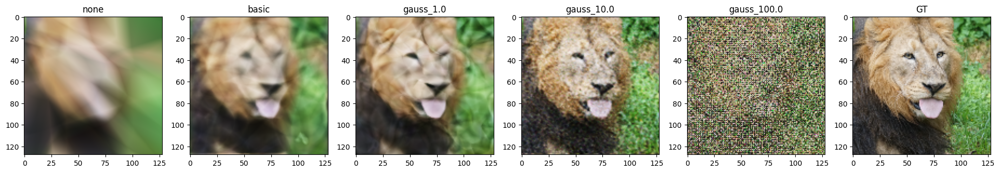

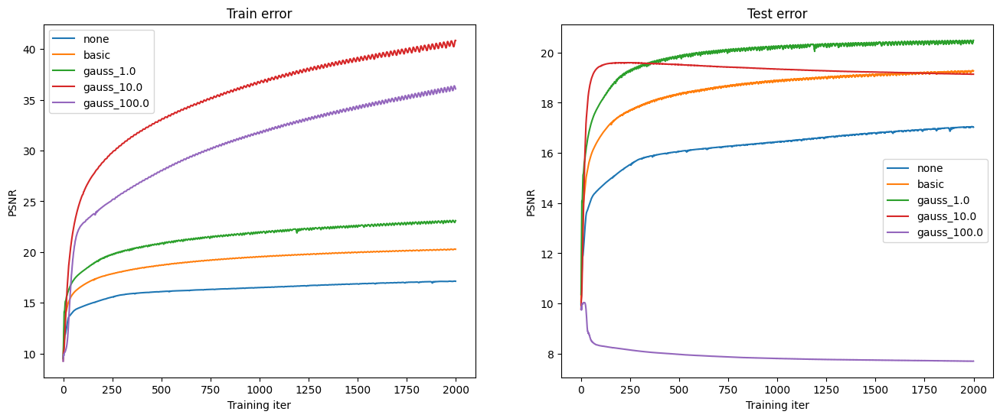

In [21]:
X_train, y_train, X_test, y_test = get_input_features(get_B_dict(size), "none")  # for getting y_test

plot_feature_mapping_comparison(outputs, y_test.reshape(size,size,3))